In [62]:
import os
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from config import Config
import utils
import model as modellib
import visualize
from model import log
from glob import glob
import random
%matplotlib inline 
from PIL import Image
# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
%reload_ext autoreload
%autoreload 2

In [63]:
class NucleiConfig(Config):
    """Configuration for training on the toy shapes dataset.
    Derives from the base Config class and overrides values specific
    to the toy shapes dataset.
    """
    # Give the configuration a recognizable name
    NAME = "Nuclei"

    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + nuclei

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 161
    IMAGE_MAX_DIM = 1408

    # Use smaller anchors because our objects are small
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)  # anchor side in pixels

    # Reduce training ROIs per image because the images are small and have
    # few objects. Aim to allow ROI sampling to pick 33% positive ROIs.
    TRAIN_ROIS_PER_IMAGE = 32

    STEPS_PER_EPOCH = 500

    VALIDATION_STPES = 20
    
    RPN_ANCHOR_STRIDE = 1
    
config = NucleiConfig()
config.print()


Configurations:
BACKBONE_SHAPES                [[352 352]
 [176 176]
 [ 88  88]
 [ 44  44]
 [ 22  22]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [ 0.1  0.1  0.2  0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1408
IMAGE_MIN_DIM                  161
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1408 1408    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.002
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [ 123.7  116.8  103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           Nuclei
NUM_CLASSES                    2
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAIN

In [64]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [65]:
class NucleiDataset(utils.Dataset):
    def load_nuclei(self, dataset_dir, subset):
        # Path
        image_dir = os.path.join(dataset_dir, 'stage1_train/')
        self.add_class("nuclei", 1, "nuclei")
        
        csv_file = {
            'train': os.path.join(dataset_dir,'train_ids_620.csv'),
            'val':os.path.join(dataset_dir,'train_ids_50.csv')
        }
        ids = pd.read_csv(csv_file[subset])
        image_ids = list(ids['ImageId'])
        # Add images
        for i in image_ids:
            self.add_image(
                "nuclei", image_id=i,
                path=os.path.join(image_dir,  i + '/original.PNG'),
                masks_path = os.path.join(image_dir, i +'/masks/'))
    
    def load_image(self, image_id):
        # Load image
        image = np.array(Image.open(self.image_info[image_id]['path']).convert('RGB'))
        return image
    
    def load_mask(self, image_id):
        """Load instance masks for the given image.

        Different datasets use different ways to store masks. This
        function converts the different mask format to one format
        in the form of a bitmap [height, width, instances].

        Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        image_info = self.image_info[image_id]
        instance_masks = []
        masks_path = glob(image_info['masks_path'] + '*')
        class_ids = list(np.ones(len(masks_path)))
        for i in masks_path:
            instance_masks.append(np.array(Image.open(i)))
        # Pack instance masks into an array
        if class_ids:
            mask = np.stack(instance_masks, axis=2)
            class_ids = np.array(class_ids, dtype=np.int32)
            return mask, class_ids
        else:
            # Call super class to return an empty mask
            return super(self.__class__).load_mask(image_id)

    def image_reference(self, image_id):
        """Return a link to the image in the COCO Website."""
        info = self.image_info[image_id]
        if info["source"] == "nuclei":
            return "https://www.kaggle.com/c/data-science-bowl-2018/data"
        else:
            super(self.__class__).image_reference(self, image_id)


In [66]:
# Training dataset
dataset_train = NucleiDataset()
dataset_train.load_nuclei('/root/kaggle/','train')
dataset_train.prepare()

# Validation dataset
dataset_val = NucleiDataset()
dataset_val.load_nuclei('/root/kaggle/','val')
dataset_val.prepare()

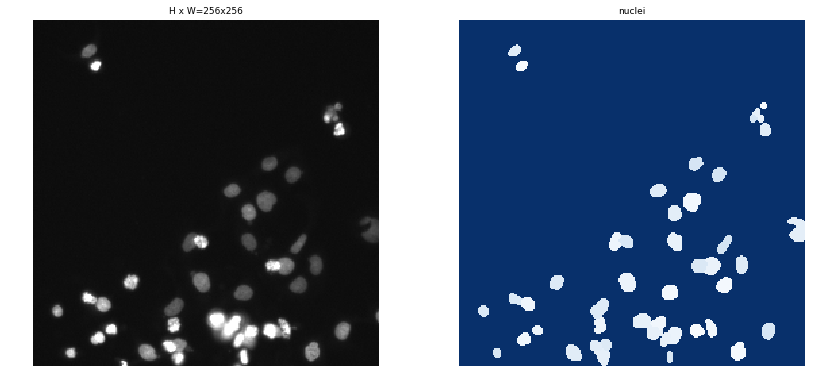

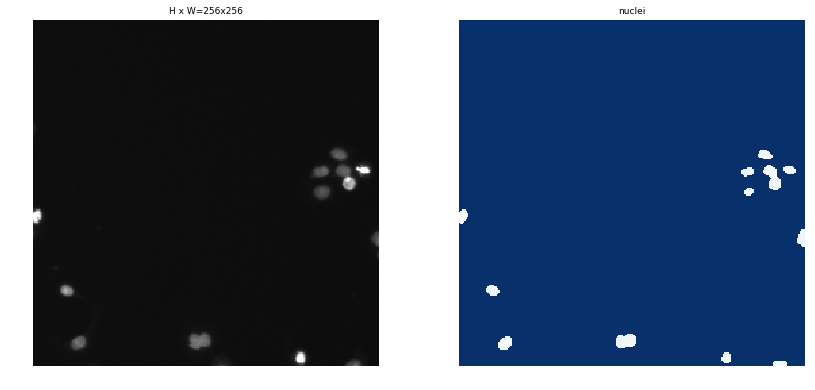

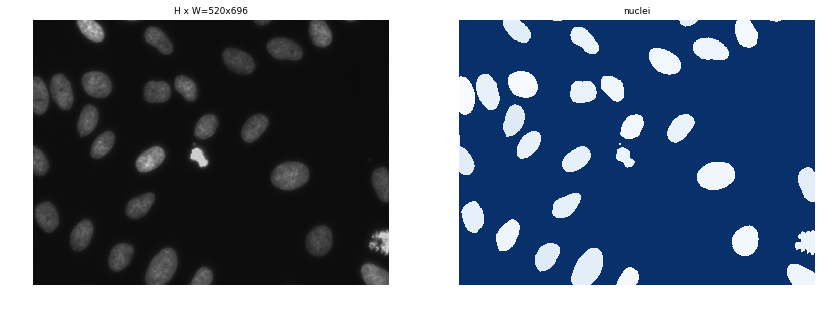

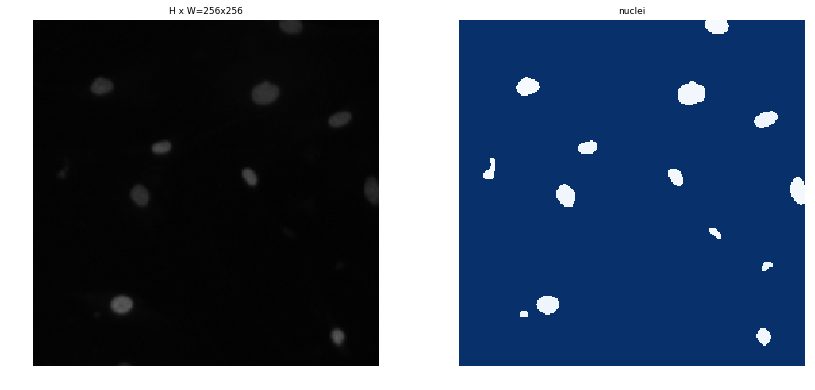

In [67]:
# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 4)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names, limit=1)

In [68]:
class Tconfig(NucleiConfig):
    LEARNING_RATE = 2e-3
    IMAGES_PER_GPU = 2
config = Tconfig()
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

In [69]:
# Which weights to start with?
init_with = "last"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last()[1], by_name=True)

In [142]:
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=10, 
            layers='heads')


Starting at epoch 5. LR=0.002

Checkpoint Path: /root/Cloud_Mask_RCNN/logs/nuclei20180129T1845/mask_rcnn_nuclei_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask

/usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/gradients_impl.py:96: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:2023: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


Epoch 6/10
500/500 [==============================] - 2203s 4s/step - loss: 1.1977 - rpn_class_loss: 0.0154 - rpn_bbox_loss: 0.2742 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.2166 - val_loss: 0.9657 - val_rpn_class_loss: 0.0090 - val_rpn_bbox_loss: 0.2459 - val_mrcnn_class_loss: 0.0934 - val_mrcnn_bbox_loss: 0.1322 - val_mrcnn_mask_loss: 0.1512
Epoch 7/10
500/500 [==============================] - 1883s 4s/step - loss: 1.1636 - rpn_class_loss: 0.0135 - rpn_bbox_loss: 0.2559 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.2151 - val_loss: 0.9824 - val_rpn_class_loss: 0.0048 - val_rpn_bbox_loss: 0.2336 - val_mrcnn_class_loss: 0.1070 - val_mrcnn_bbox_loss: 0.1088 - val_mrcnn_mask_loss: 0.1954
Epoch 8/10
500/500 [==============================] - 2232s 4s/step - loss: 1.1465 - rpn_class_loss: 0.0127 - rpn_bbox_loss: 0.2507 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.1610 - mrcnn_mask_loss: 0.2146 - val_loss: 0.9736 - val_rpn_clas

In [70]:
class InferenceConfig(NucleiConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
model_path = model.find_last()[1]

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /root/Cloud_Mask_RCNN/logs/nuclei20180129T1845/mask_rcnn_nuclei_0010.h5


14
original_image           shape: (1408, 1408, 3)       min:    0.00000  max:   40.00000
image_meta               shape: (10,)                 min:    1.00000  max:  884.00000
gt_bbox                  shape: (24, 5)               min:    1.00000  max:  884.00000
gt_mask                  shape: (1408, 1408, 24)      min:    0.00000  max:  255.00000


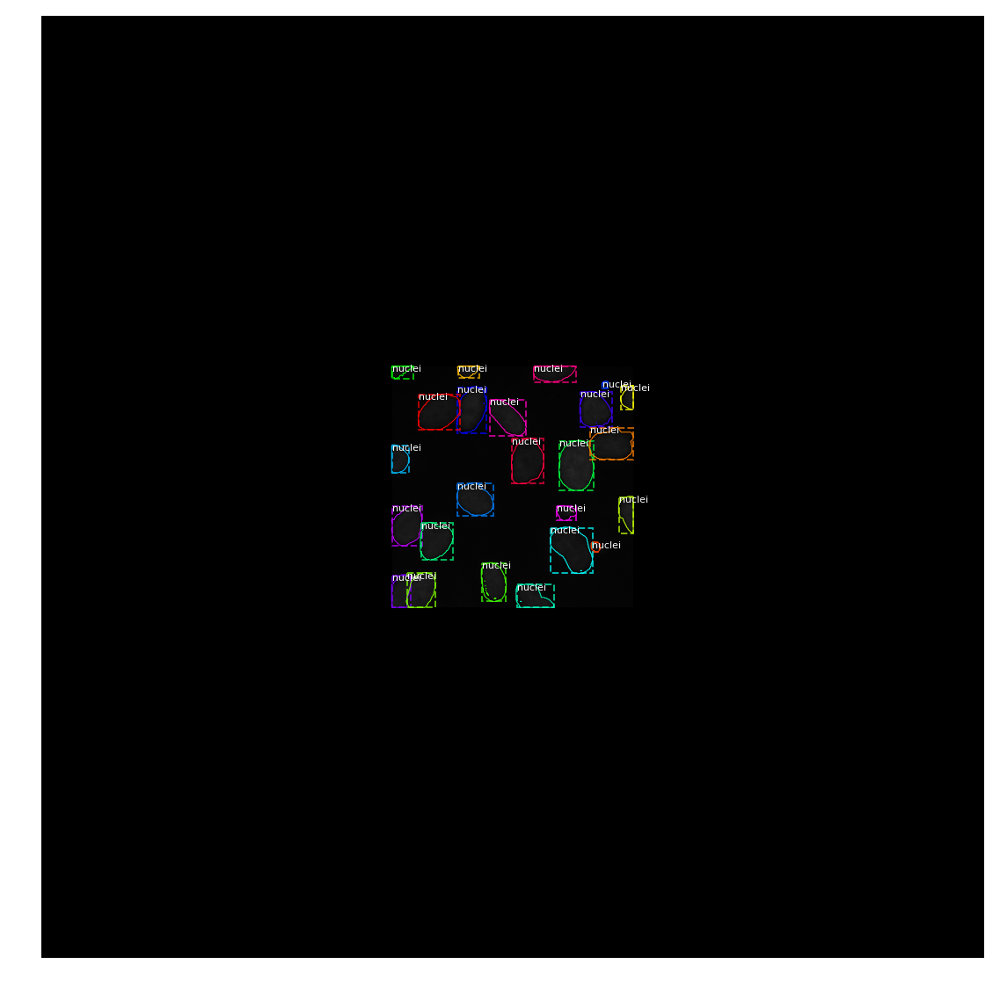

In [61]:
# Test on a random image
image_id = random.choice(dataset_val.image_ids)
print(image_id)
original_image, image_meta, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inference_config, 
                           image_id, use_mini_mask=False)

log("original_image", original_image)
log("image_meta", image_meta)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

visualize.display_instances(original_image, gt_bbox[:,:4], gt_mask, gt_bbox[:,4], 
                            dataset_train.class_names, figsize=(20, 20))

Processing 1 images
image                    shape: (1408, 1408, 3)       min: -123.70000  max:   -3.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max: -107.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1408.00000


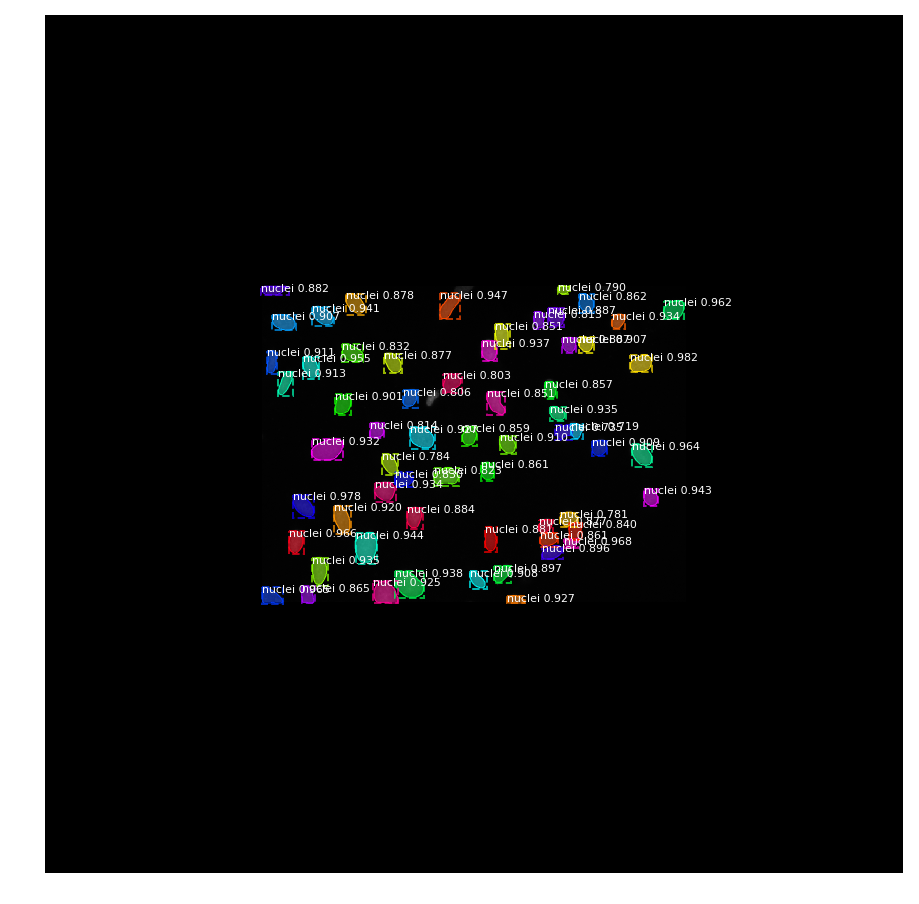

In [73]:
image_id = np.random.choice(dataset_val.image_ids)
image, image_meta, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config,
                               image_id, use_mini_mask=False)
molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
# Run object detection
results = model.detect(molded_images, verbose=1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'])

In [10]:
# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
image_ids = np.random.choice(dataset_val.image_ids, 50)
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox[:,:4], gt_bbox[:,4],
                         r["rois"], r["class_ids"], r["scores"])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

mAP:  0.77207230121


In [11]:
import sys
DATA_DIR = '/root/kaggle/'
IMAGE_SIZE = 1408
sys.path.append(DATA_DIR)
from nuclei.mask import mask_encoding_alt,mask_encoding
import utils
import pandas as pd
from PIL import Image

In [29]:
df = pd.read_csv(DATA_DIR + 'test_ids.csv')
imageids = list(df['ImageId'])
print(len(imageids))
img_paths = []
for i in imageids:
    img_path = DATA_DIR + 'stage1_test/' + i + '/images/' + i + '.png'
    img_paths.append(img_path)
print(len(img_paths))

65
65


Processing 1 images
image                    shape: (256, 320, 3)         min:  -53.80000  max:  109.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -170.60000  max:    5.20000
image_metas              shape: (1, 10)               min:    0.00000  max:  864.00000
(256, 320, 3)


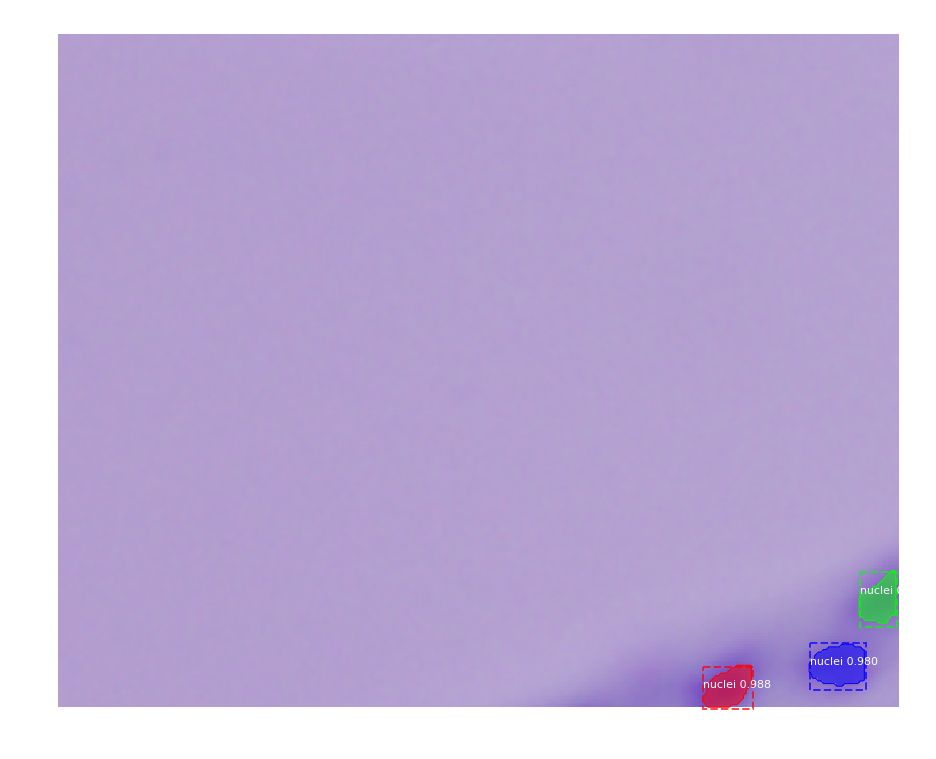

In [59]:
img = "af576e8ec3a8d0b57eb6a311299e9e4fd2047970d3dd9d6f52e54ea6a91109da"
img_path = DATA_DIR + 'stage1_train/' + img + '/images/' + img + '.png'
img = np.array(Image.open(img_path).convert('RGB'))
molded_images = np.expand_dims(modellib.mold_image(img, inference_config), 0)
# Run object detection

results = model.detect(molded_images, verbose=1)
r = results[0]
visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'])
print(r['masks'].shape)

0 /root/kaggle/stage1_test/0114f484a16c152baa2d82fdd43740880a762c93f436c8988ac461c5c9dbe7d5/images/0114f484a16c152baa2d82fdd43740880a762c93f436c8988ac461c5c9dbe7d5.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -122.70000  max:  -24.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -246.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


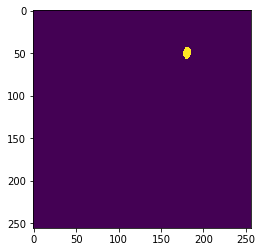

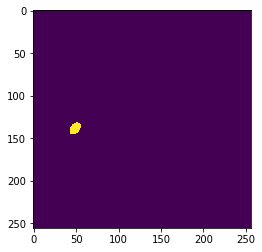

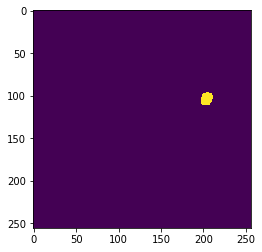

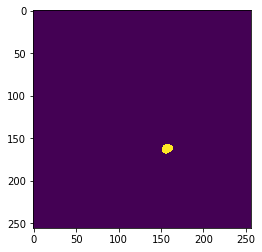

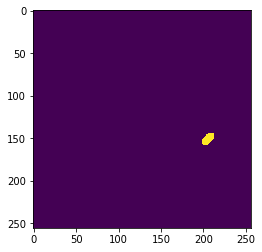

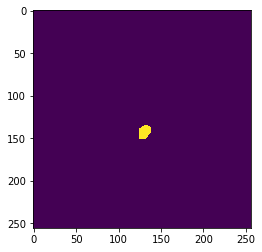

1 /root/kaggle/stage1_test/0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac/images/0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac.png
Processing 1 images
image                    shape: (519, 253, 3)         min: -112.70000  max:  138.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -236.40000  max:   34.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


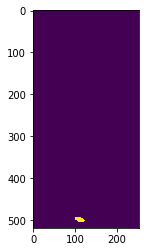

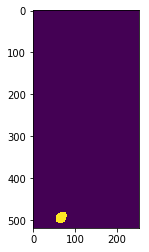

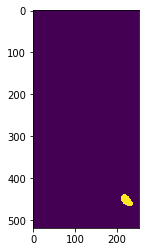

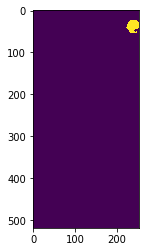

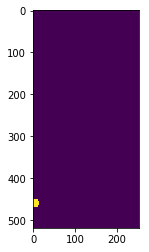

...

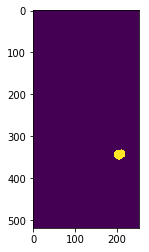

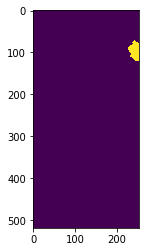

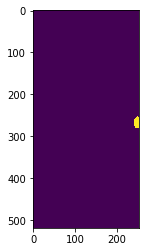

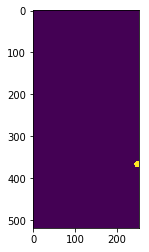

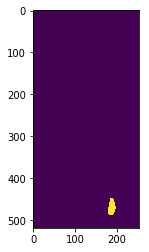

2 /root/kaggle/stage1_test/0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732/images/0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


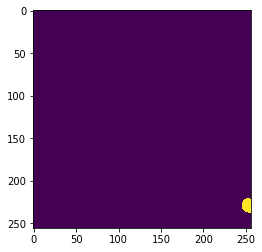

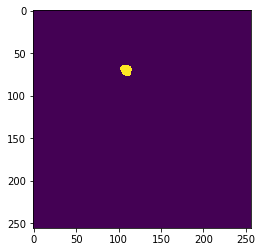

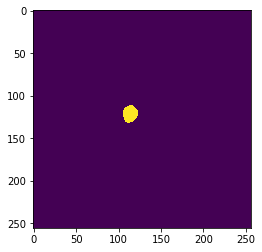

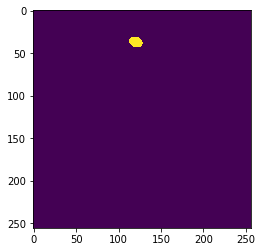

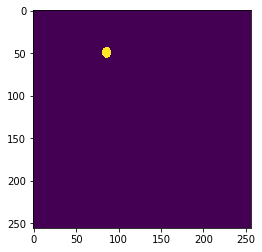

...

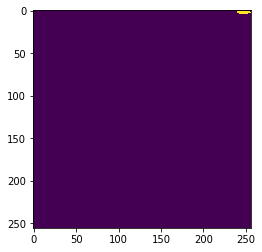

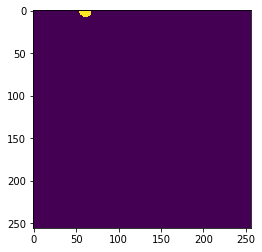

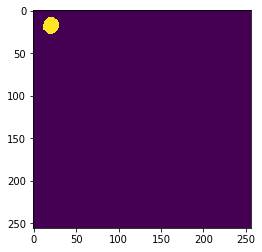

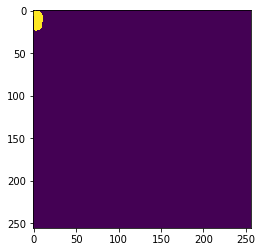

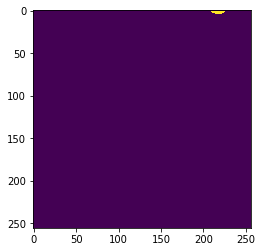

3 /root/kaggle/stage1_test/0e132f71c8b4875c3c2dd7a22997468a3e842b46aa9bd47cf7b0e8b7d63f0925/images/0e132f71c8b4875c3c2dd7a22997468a3e842b46aa9bd47cf7b0e8b7d63f0925.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -114.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -238.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


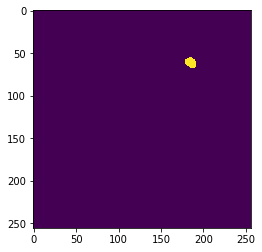

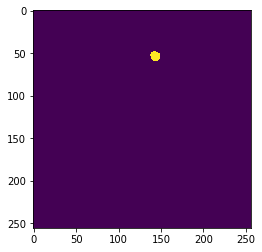

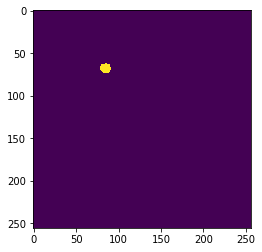

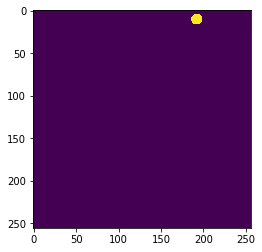

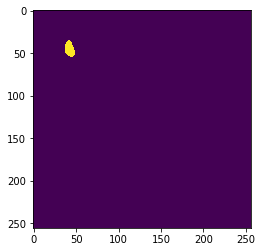

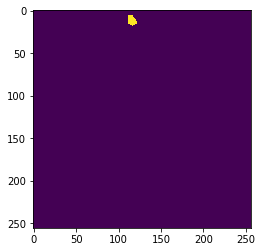

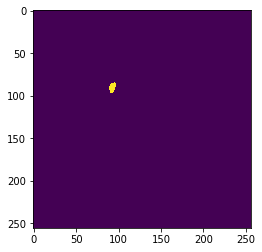

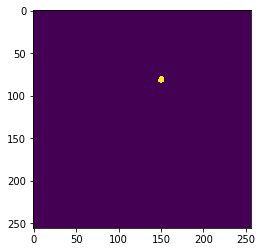

4 /root/kaggle/stage1_test/0ed3555a4bd48046d3b63d8baf03a5aa97e523aa483aaa07459e7afa39fb96c6/images/0ed3555a4bd48046d3b63d8baf03a5aa97e523aa483aaa07459e7afa39fb96c6.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -113.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


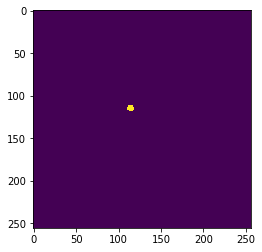

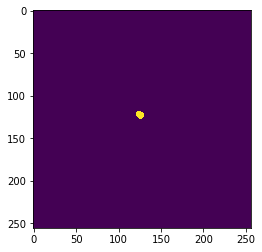

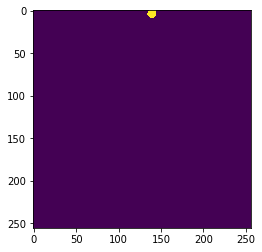

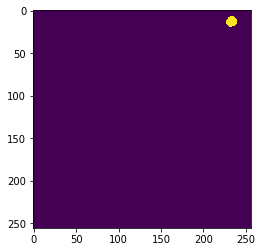

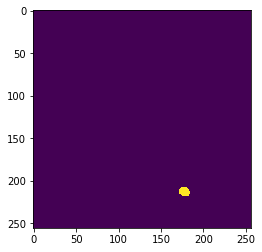

...

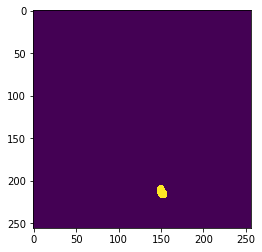

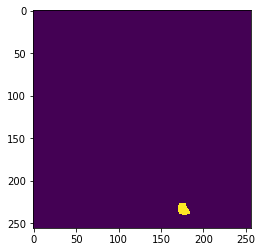

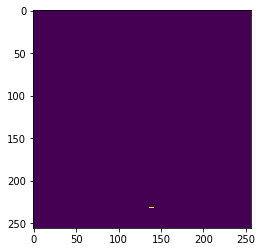

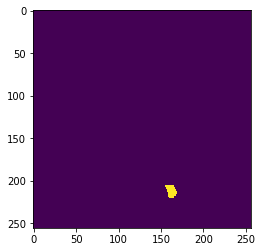

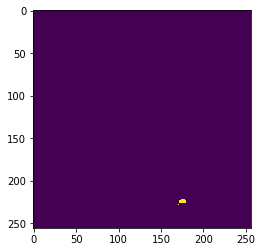

5 /root/kaggle/stage1_test/0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466/images/0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


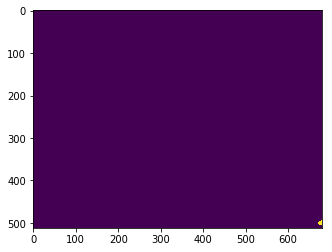

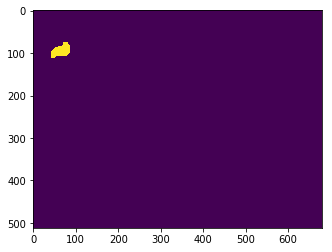

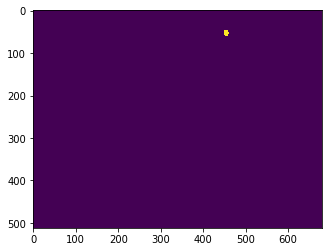

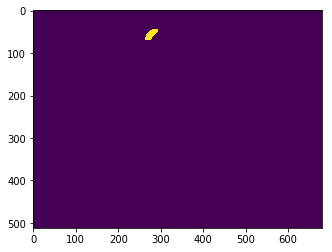

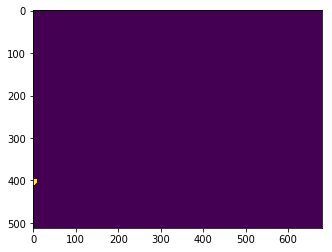

...

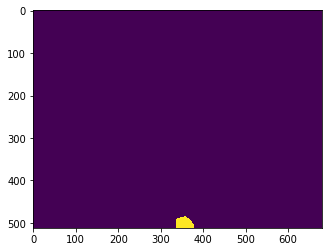

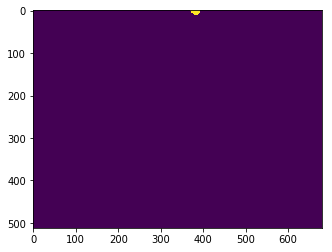

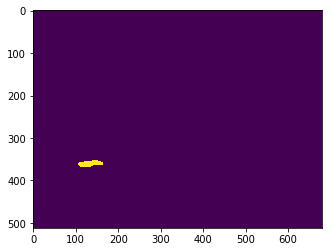

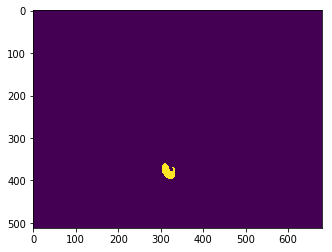

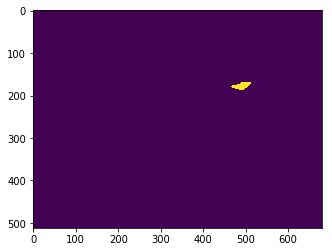

6 /root/kaggle/stage1_test/1747f62148a919c8feb6d607faeebdf504b5e2ad42b6b1710b1189c37ebcdb2c/images/1747f62148a919c8feb6d607faeebdf504b5e2ad42b6b1710b1189c37ebcdb2c.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -123.70000  max:   88.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:  -15.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


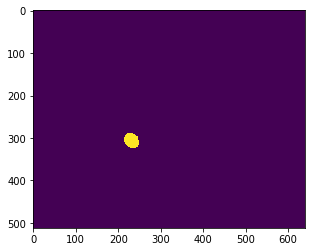

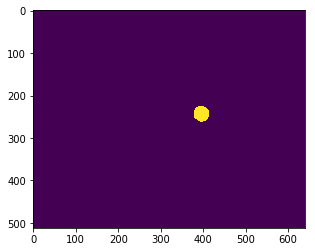

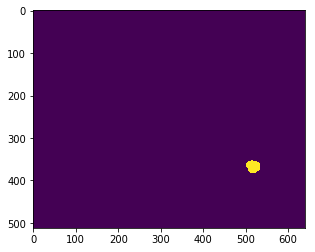

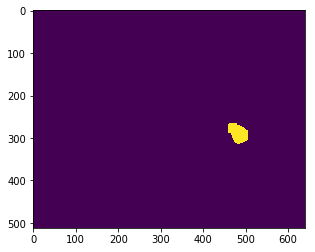

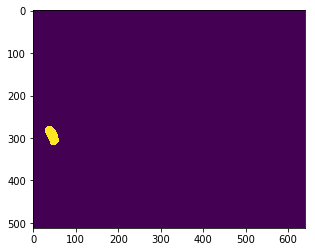

...

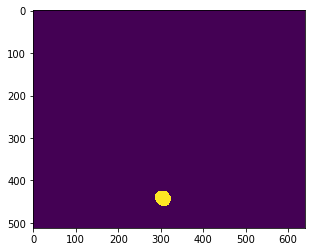

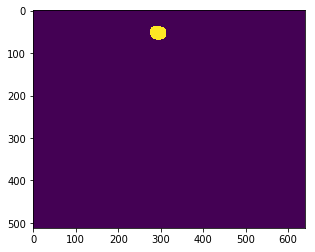

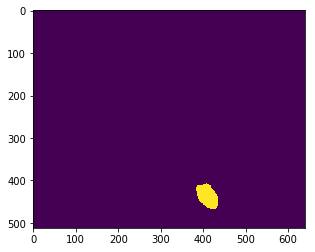

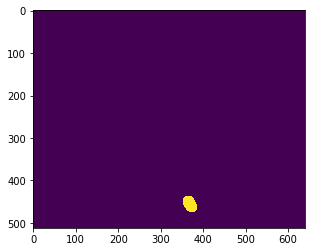

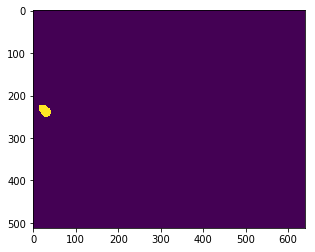

7 /root/kaggle/stage1_test/17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff/images/17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -119.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -243.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


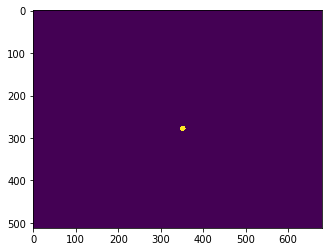

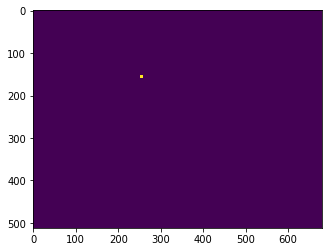

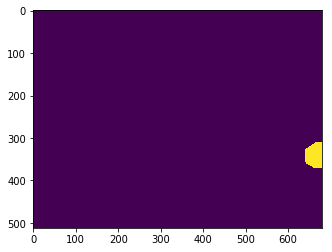

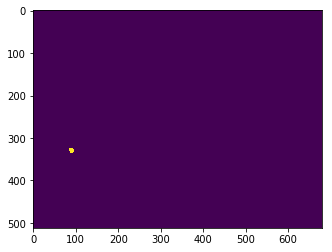

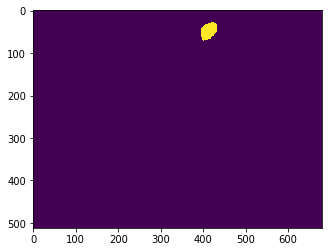

...

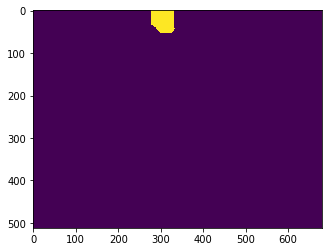

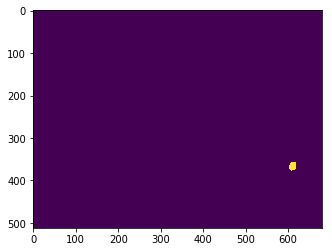

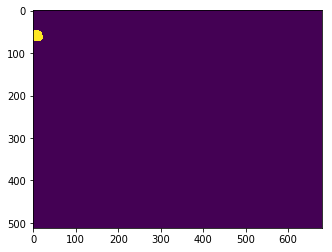

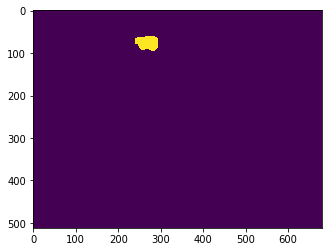

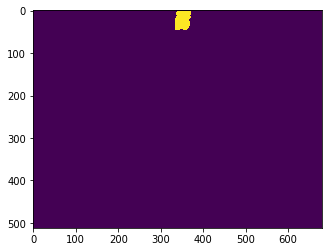

8 /root/kaggle/stage1_test/1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b/images/1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -123.70000  max:  -27.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_base.py:3239: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))


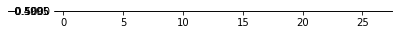

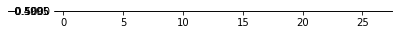

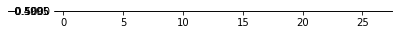

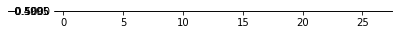

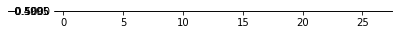

...

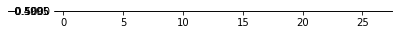

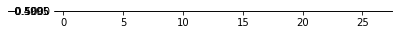

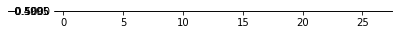

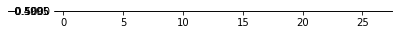

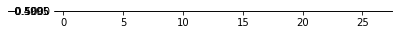

9 /root/kaggle/stage1_test/191b2b2205f2f5cc9da04702c5d422bc249faf8bca1107af792da63cccfba829/images/191b2b2205f2f5cc9da04702c5d422bc249faf8bca1107af792da63cccfba829.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -123.70000  max:    4.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:  -99.80000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


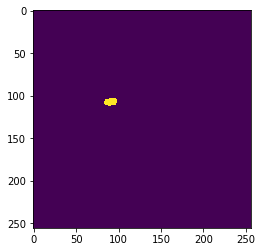

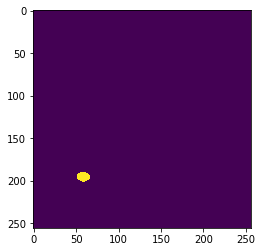

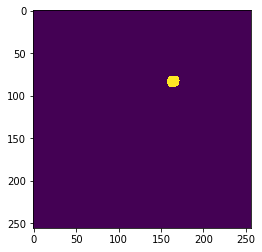

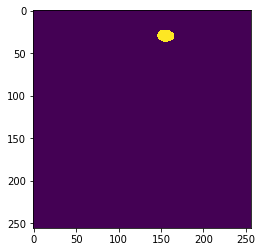

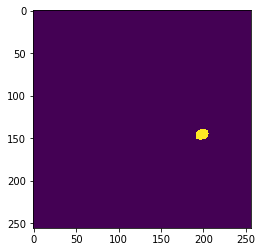

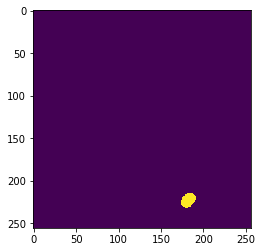

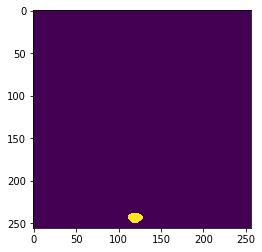

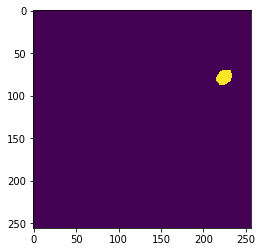

10 /root/kaggle/stage1_test/1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a/images/1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a.png
Processing 1 images
image                    shape: (519, 162, 3)         min: -122.70000  max:  101.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -246.40000  max:   -2.80000
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


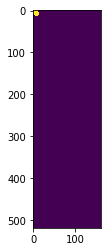

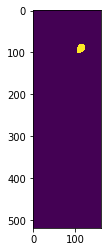

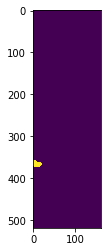

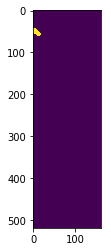

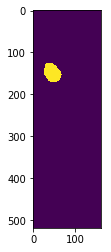

...

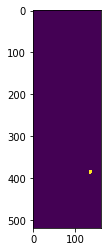

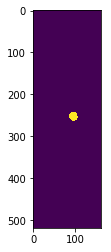

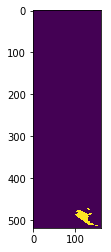

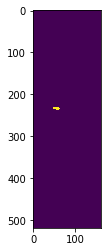

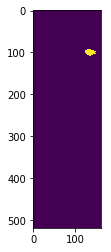

11 /root/kaggle/stage1_test/1cdbfee1951356e7b0a215073828695fe1ead5f8b1add119b6645d2fdc8d844e/images/1cdbfee1951356e7b0a215073828695fe1ead5f8b1add119b6645d2fdc8d844e.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -123.70000  max:   22.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:  -81.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


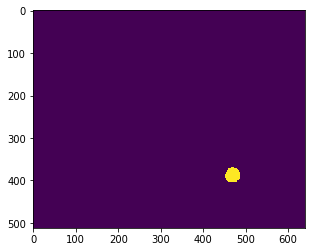

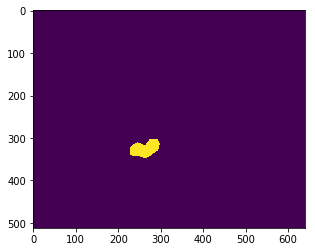

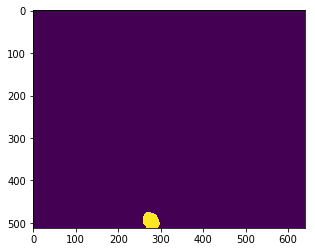

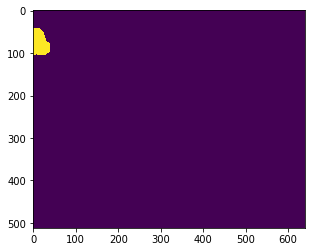

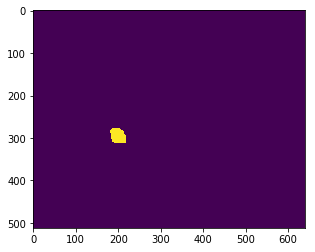

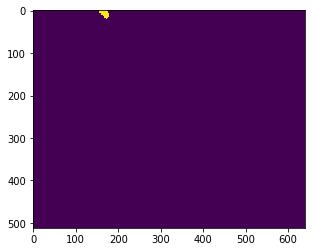

12 /root/kaggle/stage1_test/1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1/images/1d9eacb3161f1e2b45550389ecf7c535c7199c6b44b1c6a46303f7b965e508f1.png
Processing 1 images
image                    shape: (524, 348, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  966.00000


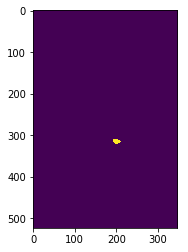

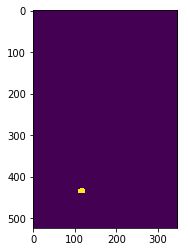

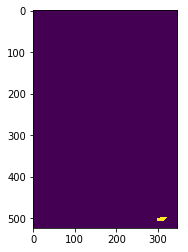

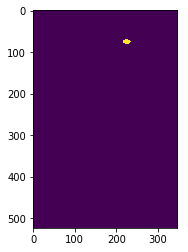

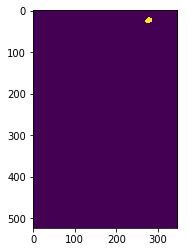

...

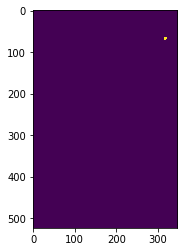

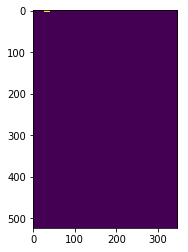

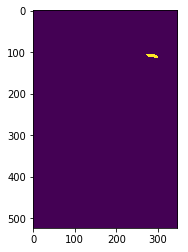

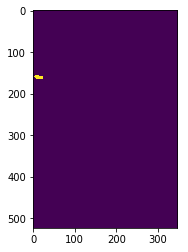

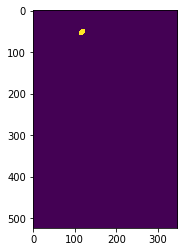

13 /root/kaggle/stage1_test/1ef68e93964c2d9230100c1347c328f6385a7bc027879dc3d4c055e6fe80cb3c/images/1ef68e93964c2d9230100c1347c328f6385a7bc027879dc3d4c055e6fe80cb3c.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -113.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


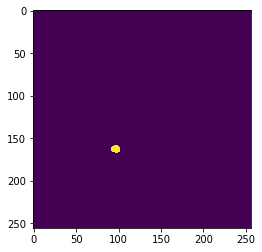

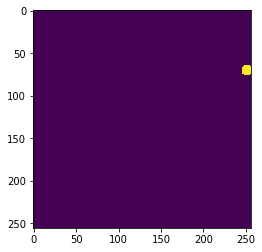

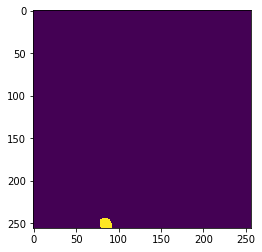

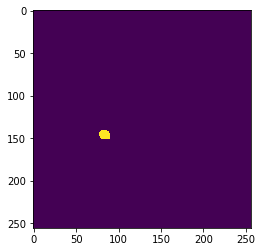

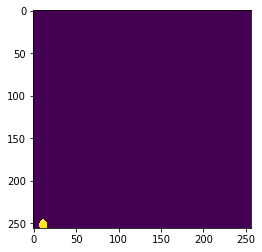

...

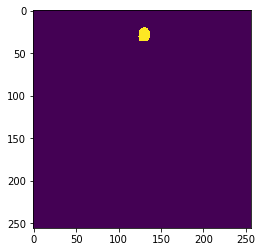

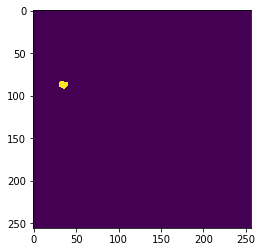

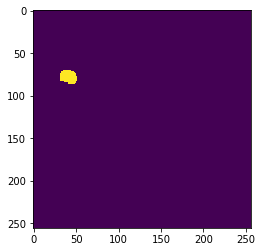

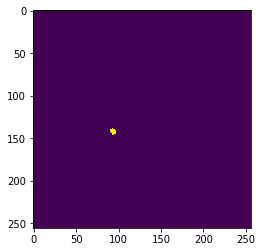

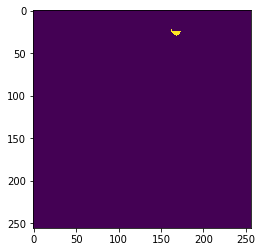

14 /root/kaggle/stage1_test/259b35151d4a7a5ffdd7ab7f171b142db8cfe40beeee67277fac6adca4d042c4/images/259b35151d4a7a5ffdd7ab7f171b142db8cfe40beeee67277fac6adca4d042c4.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -123.70000  max:  146.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   42.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


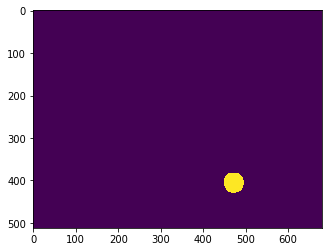

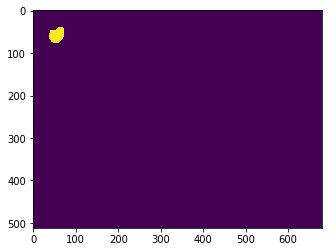

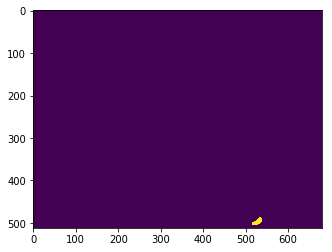

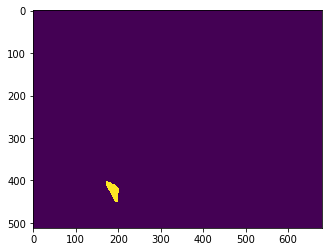

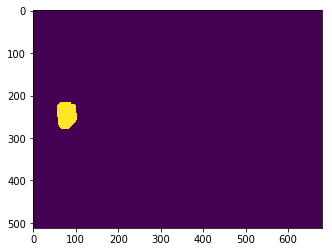

...

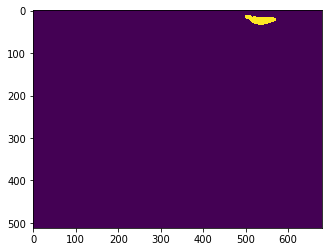

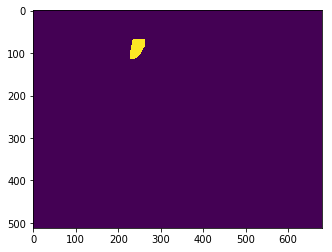

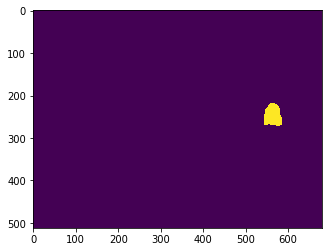

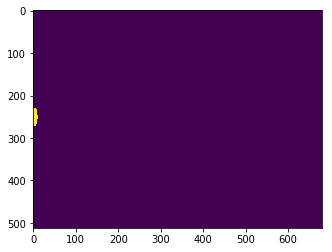

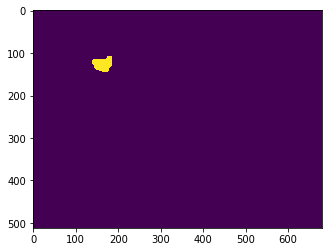

15 /root/kaggle/stage1_test/295682d9eb5acb5c1976a460c085734bfaf38482b0a3f02591c2bfdcd4128549/images/295682d9eb5acb5c1976a460c085734bfaf38482b0a3f02591c2bfdcd4128549.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -113.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


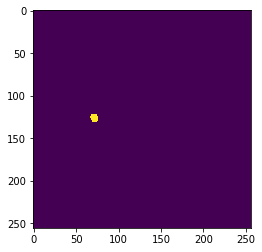

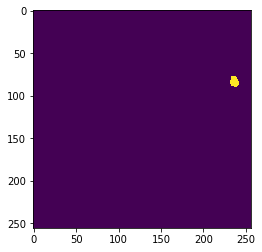

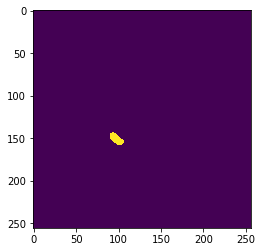

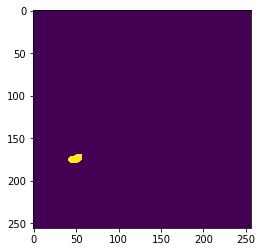

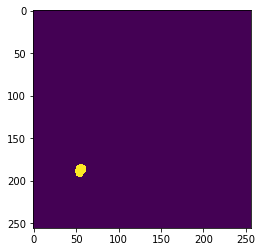

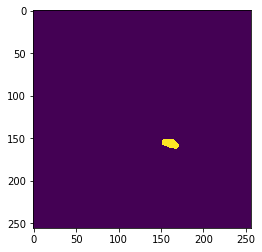

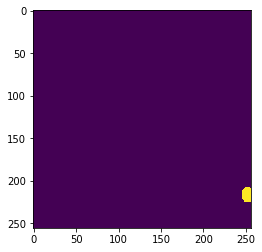

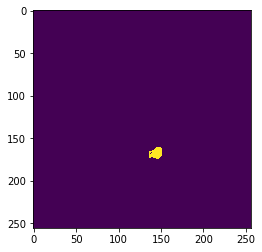

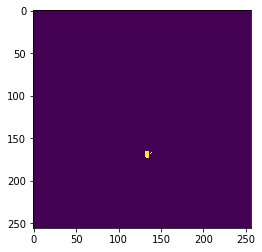

16 /root/kaggle/stage1_test/31f1fbe85b8899258ea5bcf5f93f7ac8238660c386aeab40649c715bd2e38a0a/images/31f1fbe85b8899258ea5bcf5f93f7ac8238660c386aeab40649c715bd2e38a0a.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -113.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


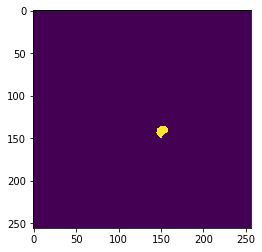

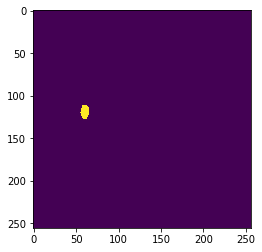

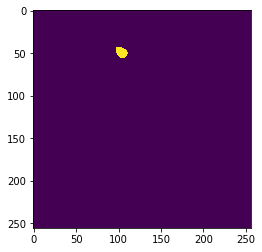

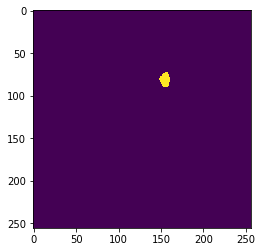

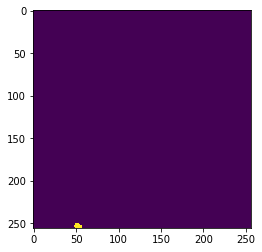

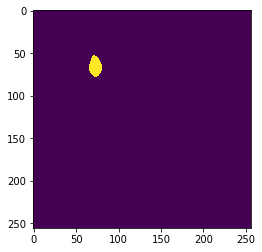

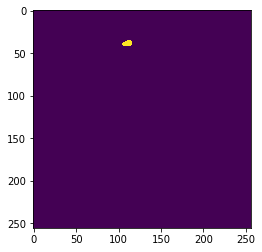

17 /root/kaggle/stage1_test/336d3e4105766f8ad328a7ee9571e743f376f8cbcf6a969ca7e353fe3235c523/images/336d3e4105766f8ad328a7ee9571e743f376f8cbcf6a969ca7e353fe3235c523.png
Processing 1 images
image                    shape: (519, 253, 3)         min: -112.70000  max:  107.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -236.40000  max:    3.20000
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


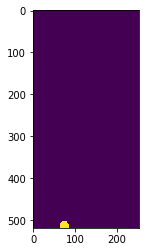

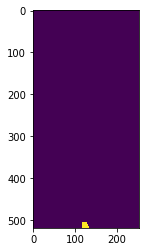

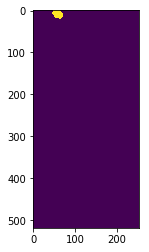

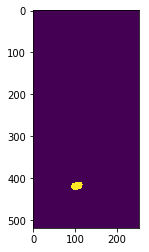

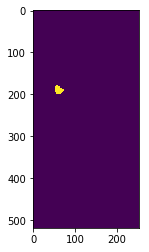

...

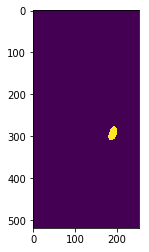

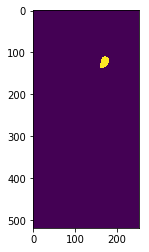

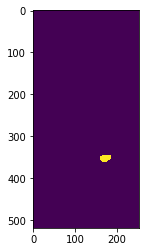

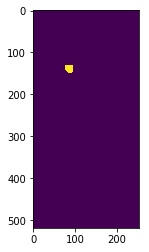

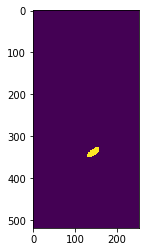

18 /root/kaggle/stage1_test/38f5cfb55fc8b048e82a5c895b25fefae7a70c71ab9990c535d1030637bf6a1f/images/38f5cfb55fc8b048e82a5c895b25fefae7a70c71ab9990c535d1030637bf6a1f.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -123.70000  max:   -2.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


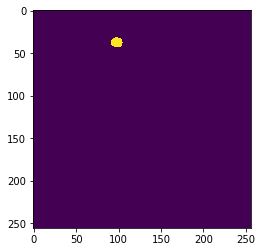

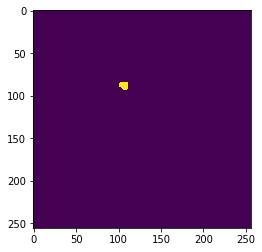

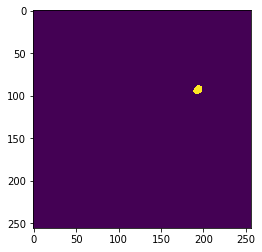

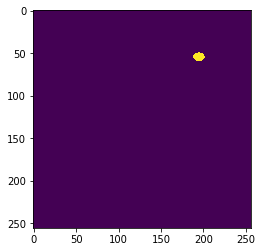

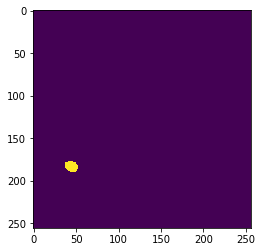

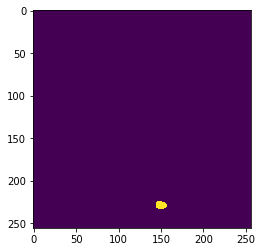

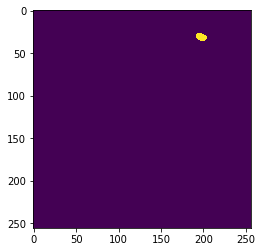

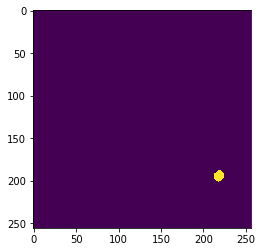

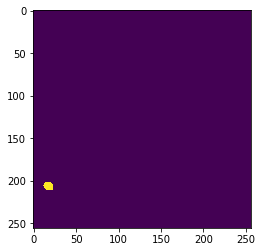

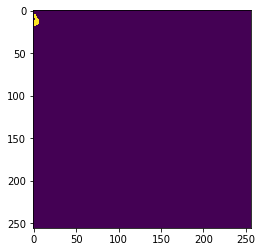

19 /root/kaggle/stage1_test/3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26/images/3c4c675825f7509877bc10497f498c9a2e3433bf922bd870914a2eb21a54fd26.png
Processing 1 images
image                    shape: (524, 348, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  966.00000


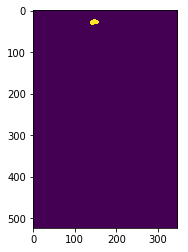

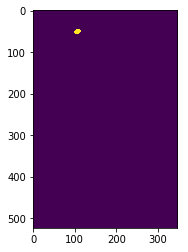

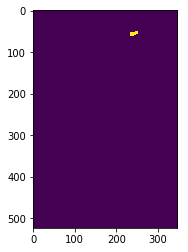

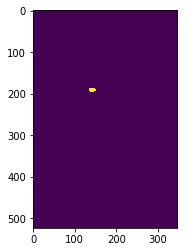

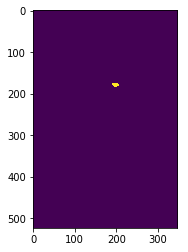

...

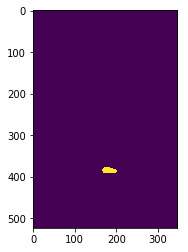

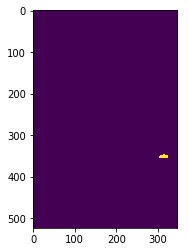

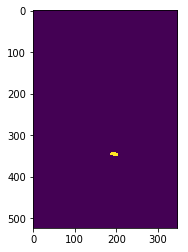

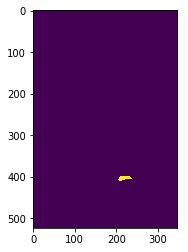

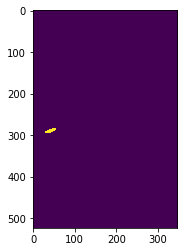

20 /root/kaggle/stage1_test/432f367a4c5b5674de2e2977744d10289a064e5704b21af6607b4975be47c580/images/432f367a4c5b5674de2e2977744d10289a064e5704b21af6607b4975be47c580.png
Processing 1 images
image                    shape: (520, 348, 3)         min: -118.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -242.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  964.00000


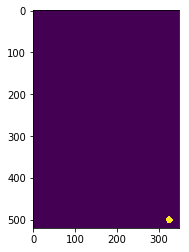

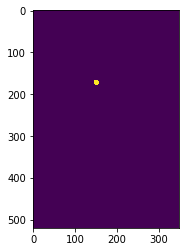

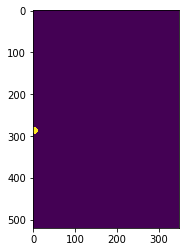

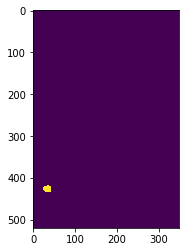

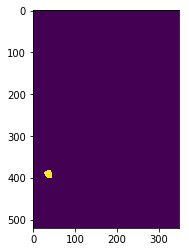

...

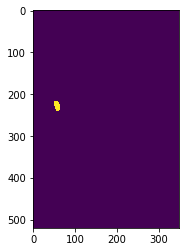

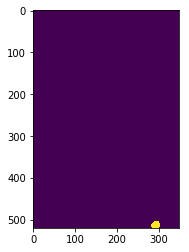

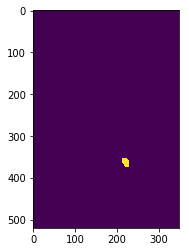

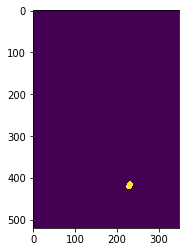

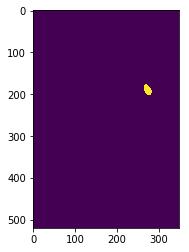

21 /root/kaggle/stage1_test/43a71aeb641faa18742cb826772a8566c6c947d7050f9ab15459de6cc2b3b6af/images/43a71aeb641faa18742cb826772a8566c6c947d7050f9ab15459de6cc2b3b6af.png
Processing 1 images
image                    shape: (260, 347, 3)         min: -121.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -245.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  877.00000


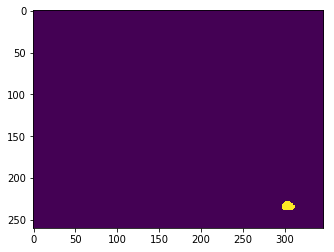

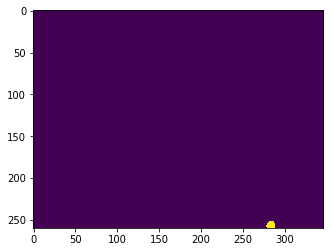

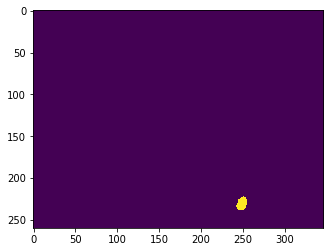

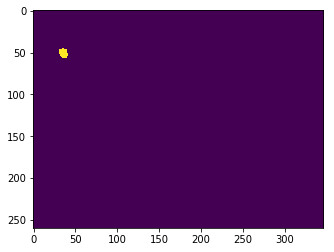

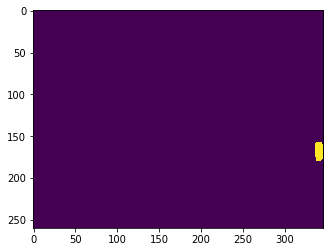

...

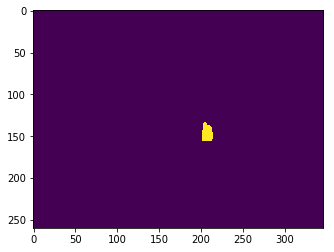

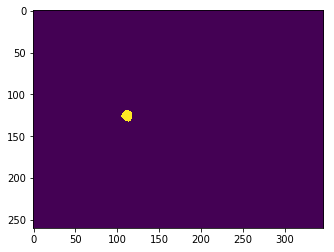

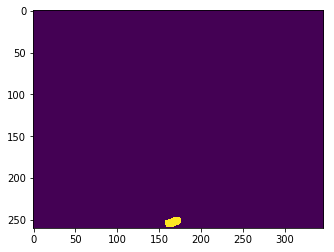

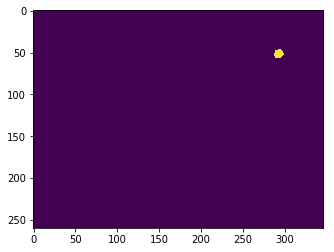

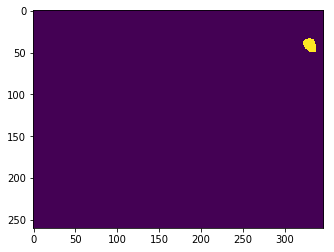

22 /root/kaggle/stage1_test/44afae184c89e6ba55985b4d341acc1ae1e8b6ef96312064e0e6e630e022b078/images/44afae184c89e6ba55985b4d341acc1ae1e8b6ef96312064e0e6e630e022b078.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


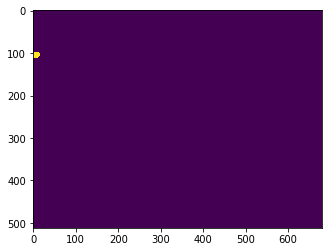

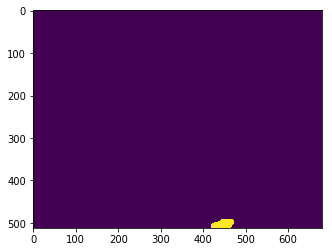

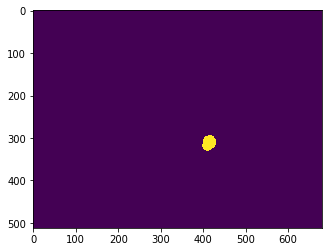

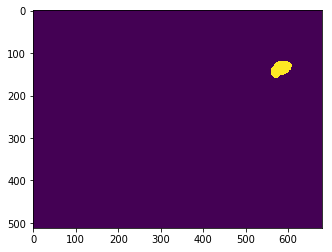

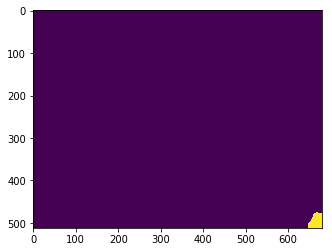

...

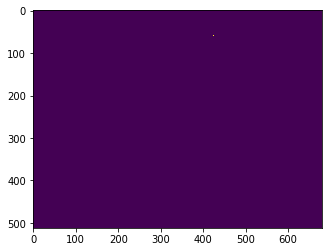

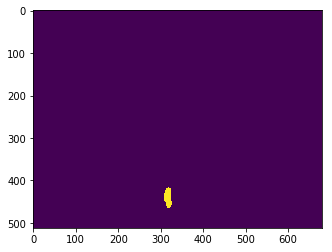

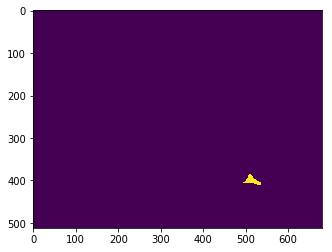

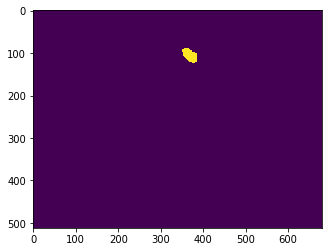

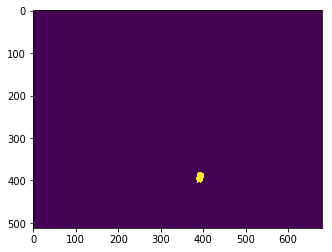

23 /root/kaggle/stage1_test/4727d94c6a57ed484270fdd8bbc6e3d5f2f15d5476794a4e37a40f2309a091e2/images/4727d94c6a57ed484270fdd8bbc6e3d5f2f15d5476794a4e37a40f2309a091e2.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -113.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


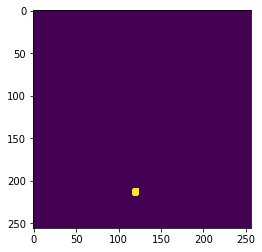

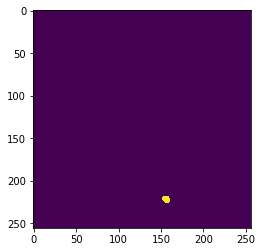

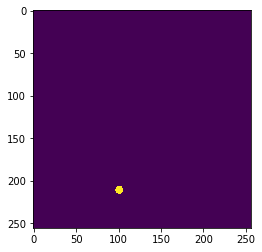

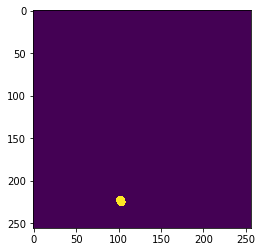

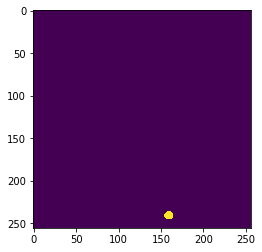

...

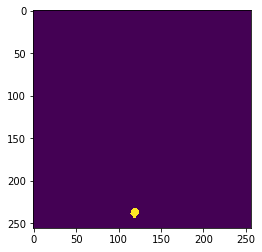

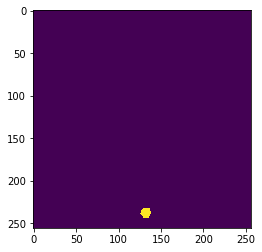

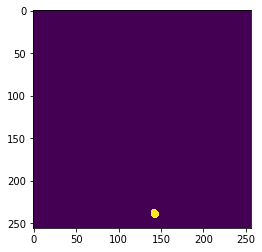

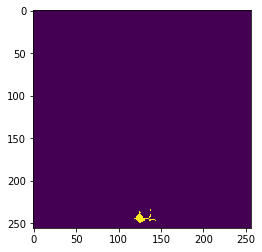

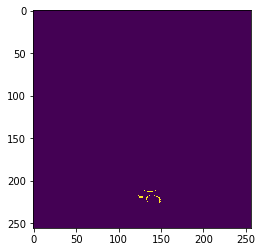

24 /root/kaggle/stage1_test/472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71/images/472b1c5ff988dadc209faea92499bc07f305208dbda29d16262b3d543ac91c71.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


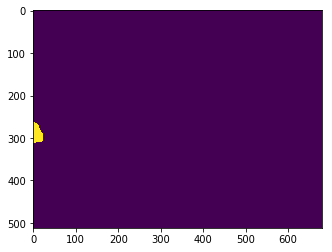

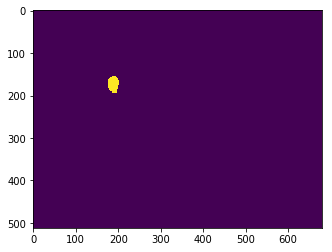

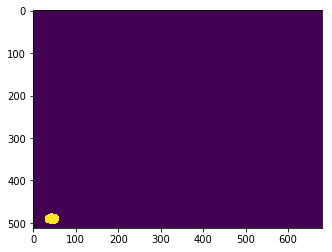

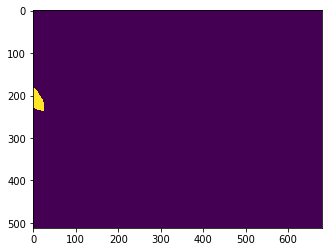

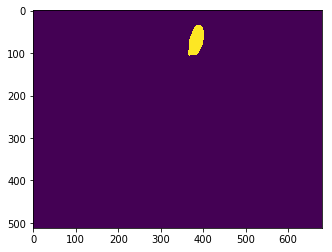

...

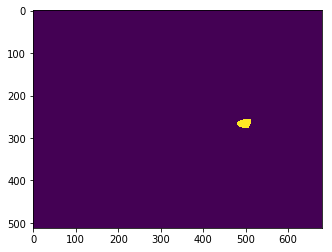

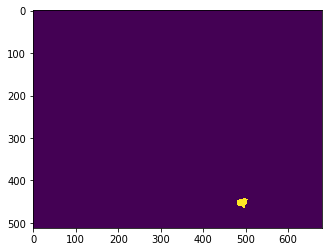

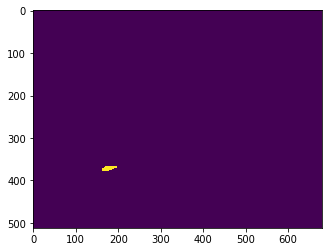

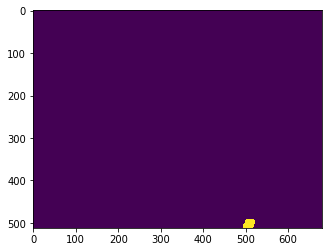

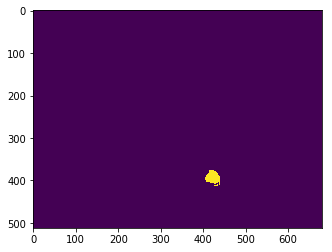

25 /root/kaggle/stage1_test/4be73d68f433869188fe5e7f09c7f681ed51003da6aa5d19ce368726d8e271ee/images/4be73d68f433869188fe5e7f09c7f681ed51003da6aa5d19ce368726d8e271ee.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


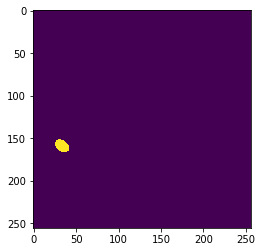

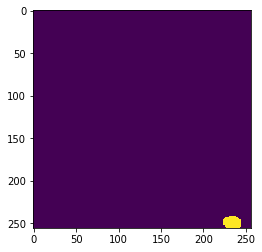

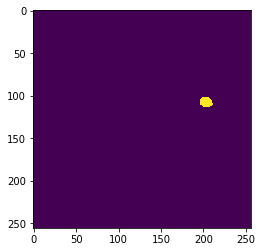

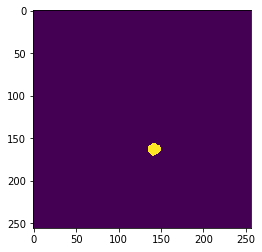

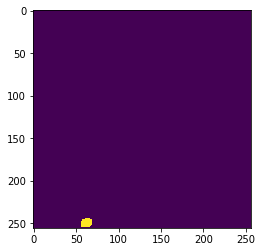

...

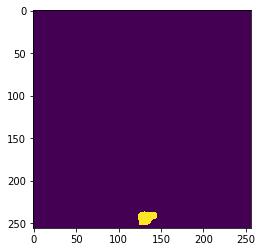

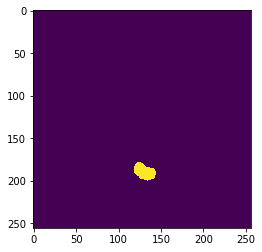

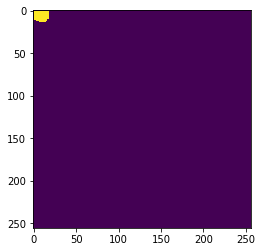

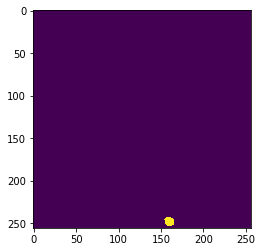

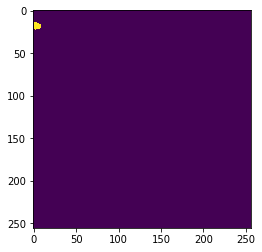

26 /root/kaggle/stage1_test/4f949bd8d914bbfa06f40d6a0e2b5b75c38bf53dbcbafc48c97f105bee4f8fac/images/4f949bd8d914bbfa06f40d6a0e2b5b75c38bf53dbcbafc48c97f105bee4f8fac.png
Processing 1 images
image                    shape: (390, 239, 3)         min: -123.70000  max:  -22.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  899.00000


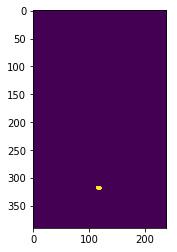

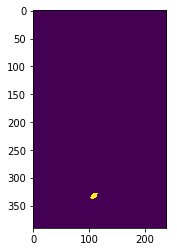

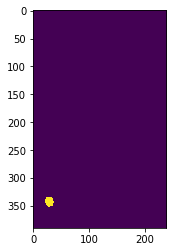

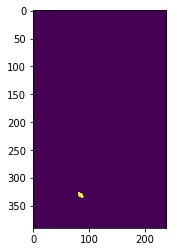

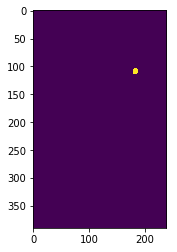

...

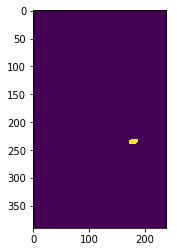

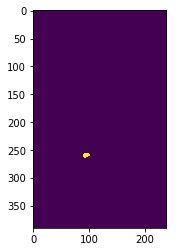

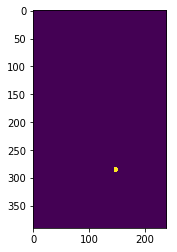

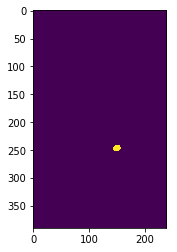

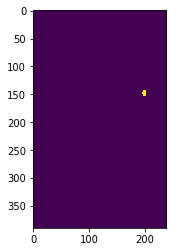

27 /root/kaggle/stage1_test/505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81/images/505bc0a3928d8aef5ce441c5a611fdd32e1e8eccdc15cc3a52b88030acb50f81.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -123.70000  max:    5.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:  -98.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


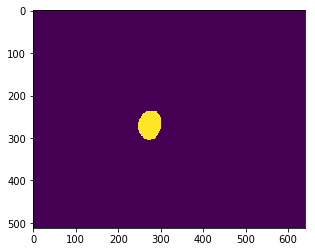

28 /root/kaggle/stage1_test/519dc0d672d1c295fc69b629af8721ccb1a1f136d1976685a68487e62547ffe0/images/519dc0d672d1c295fc69b629af8721ccb1a1f136d1976685a68487e62547ffe0.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -122.70000  max:   17.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -246.40000  max:  -86.80000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


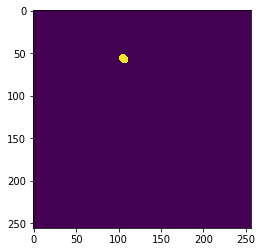

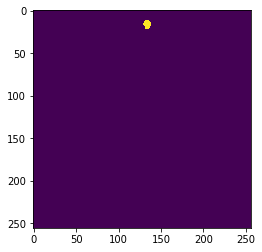

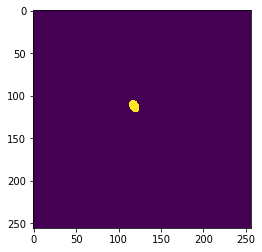

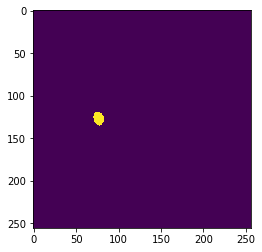

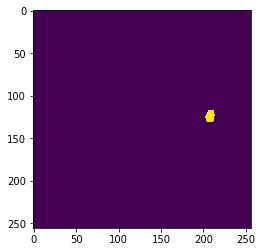

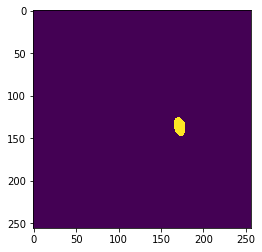

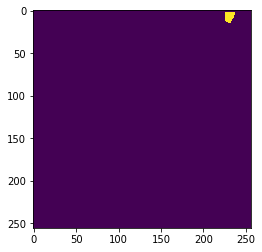

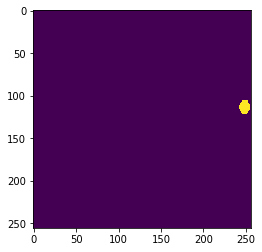

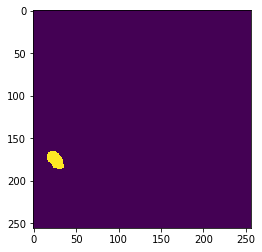

29 /root/kaggle/stage1_test/51c70bb8a299943b27f8b354571272692d8f2705036a1a9562156c76da5f025b/images/51c70bb8a299943b27f8b354571272692d8f2705036a1a9562156c76da5f025b.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -114.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -238.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


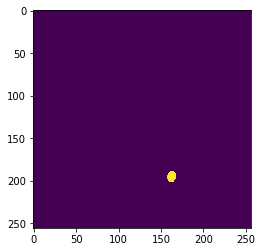

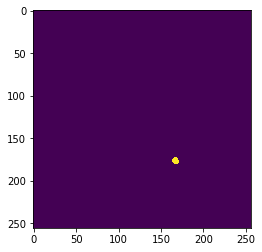

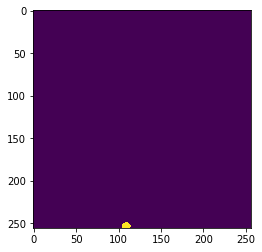

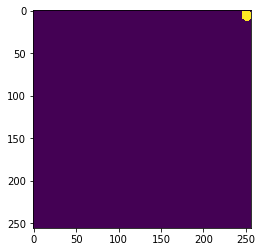

30 /root/kaggle/stage1_test/52b267e20519174e3ce1e1994b5d677804b16bc670aa5f6ffb6344a0fdf63fde/images/52b267e20519174e3ce1e1994b5d677804b16bc670aa5f6ffb6344a0fdf63fde.png
Processing 1 images
image                    shape: (260, 347, 3)         min:  -97.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -221.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  877.00000


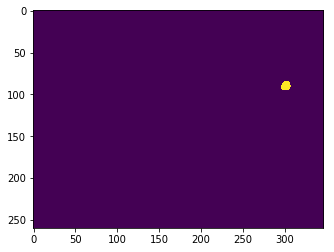

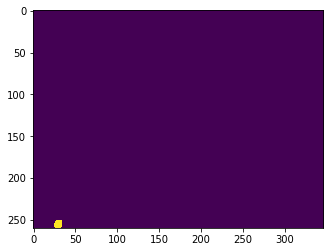

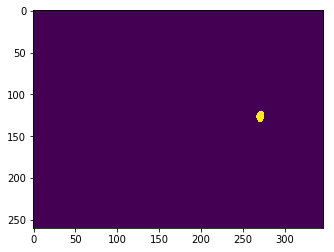

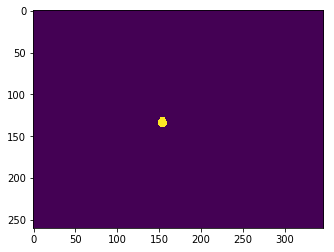

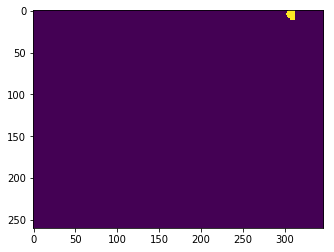

...

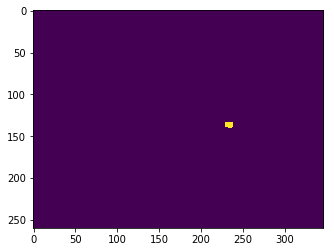

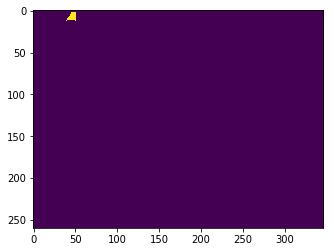

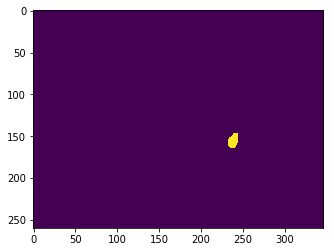

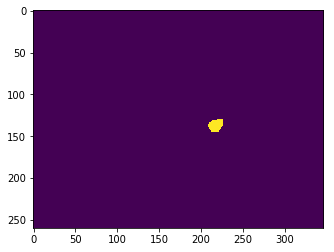

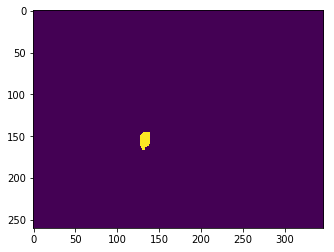

31 /root/kaggle/stage1_test/53df5150ee56253fe5bc91a9230d377bb21f1300f443ba45a758bcb01a15c0e4/images/53df5150ee56253fe5bc91a9230d377bb21f1300f443ba45a758bcb01a15c0e4.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -122.70000  max:  -10.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -246.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


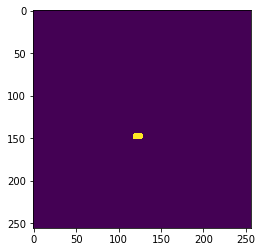

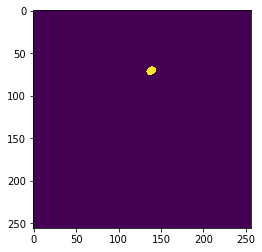

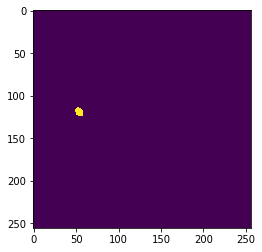

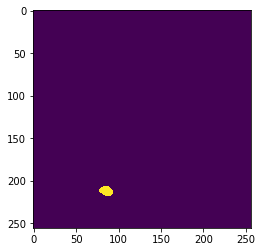

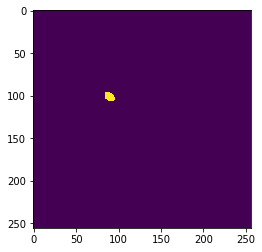

...

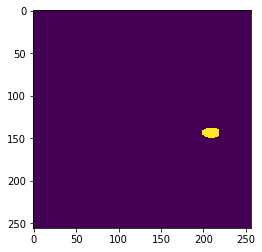

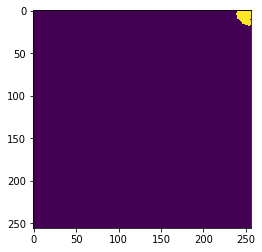

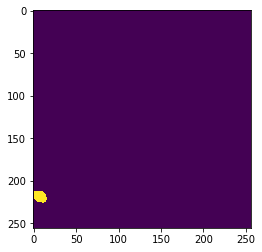

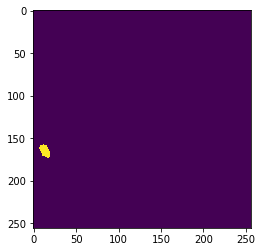

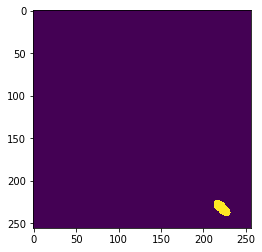

32 /root/kaggle/stage1_test/550450e4bff4036fd671decdc5d42fec23578198d6a2fd79179c4368b9d6da18/images/550450e4bff4036fd671decdc5d42fec23578198d6a2fd79179c4368b9d6da18.png
Processing 1 images
image                    shape: (520, 348, 3)         min: -120.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -244.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  964.00000


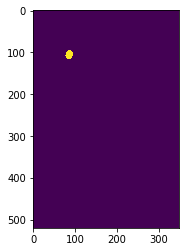

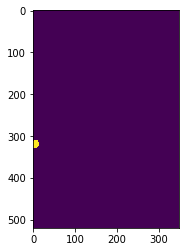

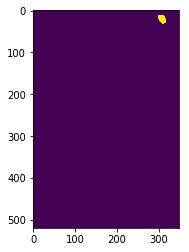

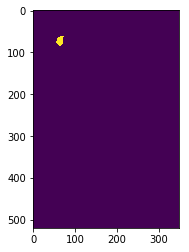

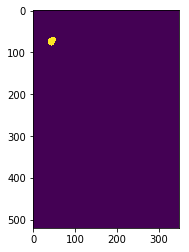

...

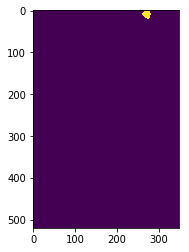

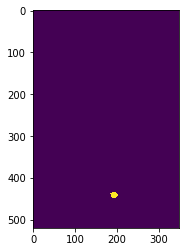

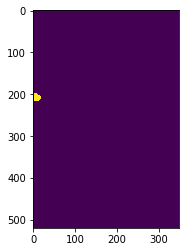

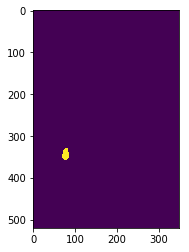

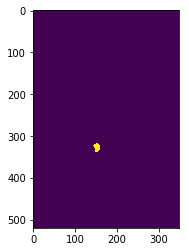

33 /root/kaggle/stage1_test/5cee644e5ffbef1ba021c7f389b33bafd3b1841f04d3edd7922d5084c2c4e0c7/images/5cee644e5ffbef1ba021c7f389b33bafd3b1841f04d3edd7922d5084c2c4e0c7.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -122.70000  max:   49.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -246.40000  max:  -54.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


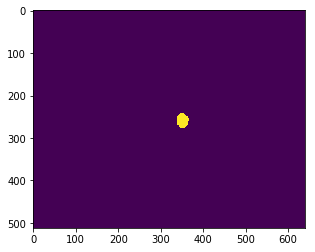

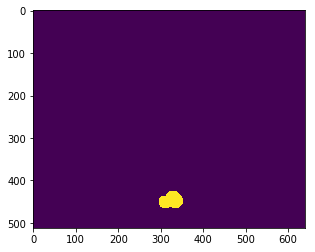

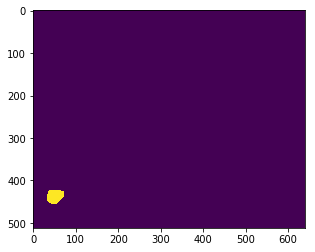

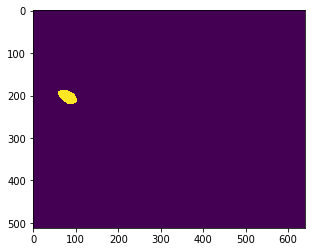

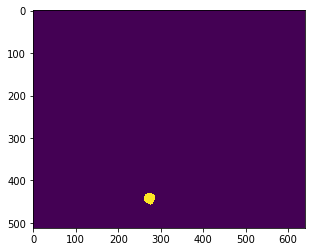

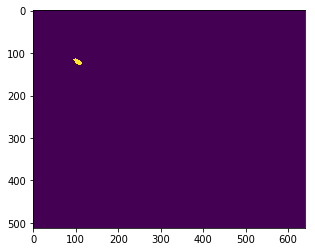

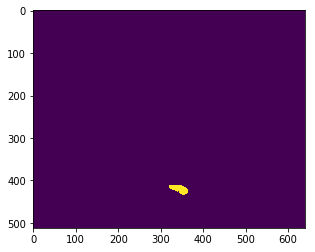

34 /root/kaggle/stage1_test/648c8ffa496e1716017906d0bf135debfc93386ae86aa3d4adbda9a505985fd9/images/648c8ffa496e1716017906d0bf135debfc93386ae86aa3d4adbda9a505985fd9.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -114.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -238.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


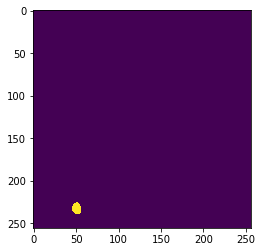

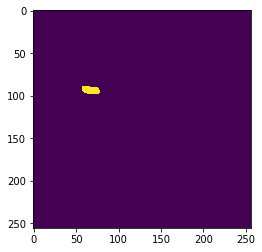

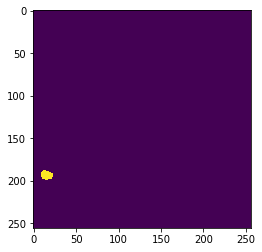

35 /root/kaggle/stage1_test/697a05c6fe4a07c601d46da80885645ad574ea19b47ee795ccff216c9f1f1808/images/697a05c6fe4a07c601d46da80885645ad574ea19b47ee795ccff216c9f1f1808.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


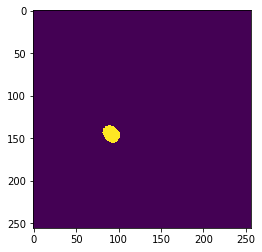

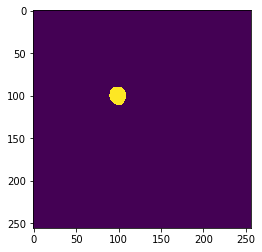

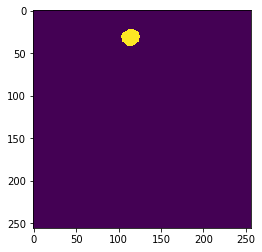

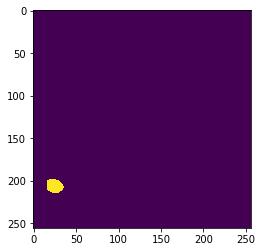

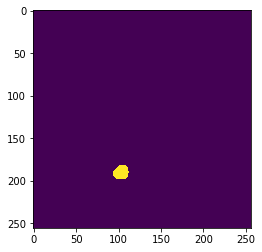

...

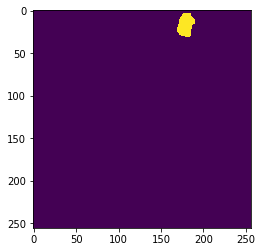

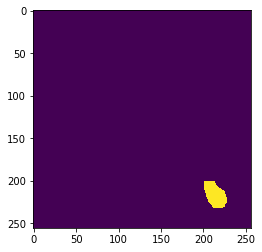

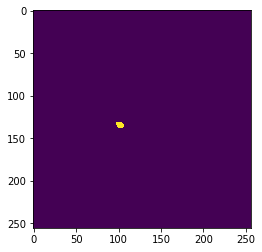

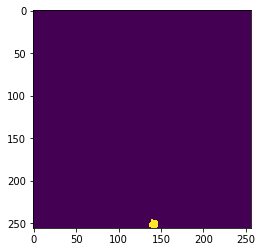

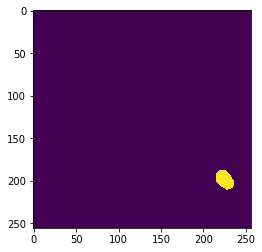

36 /root/kaggle/stage1_test/699f2992cd71e2e28cf45f81347ff22e76b37541ce88087742884cd0e9aadc68/images/699f2992cd71e2e28cf45f81347ff22e76b37541ce88087742884cd0e9aadc68.png
Processing 1 images
image                    shape: (260, 347, 3)         min:  -95.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -219.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  877.00000


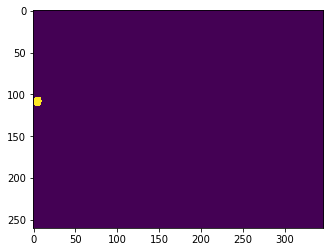

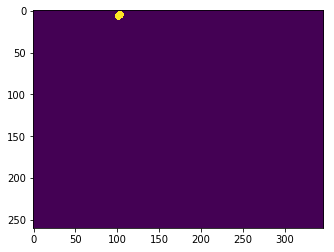

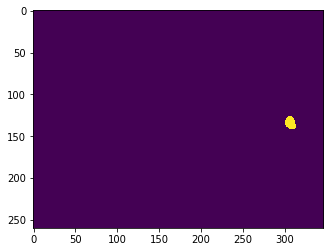

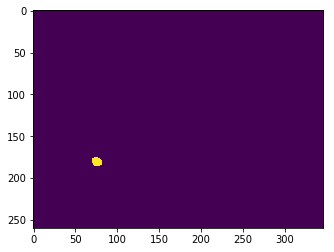

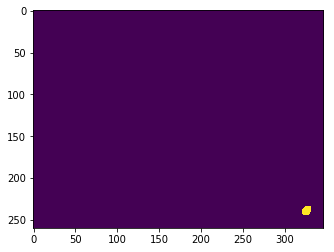

...

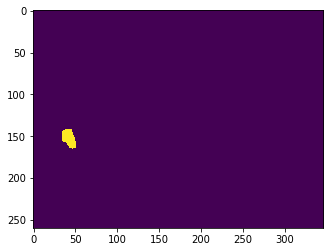

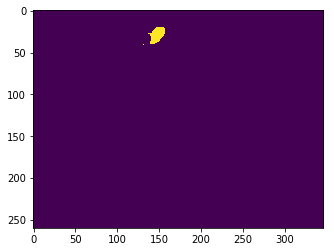

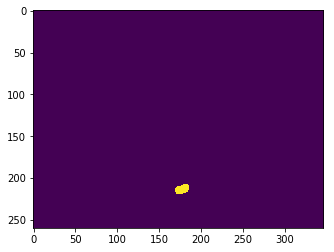

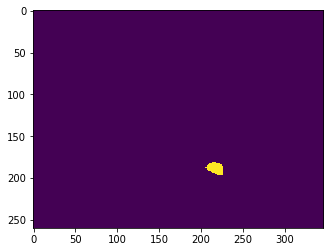

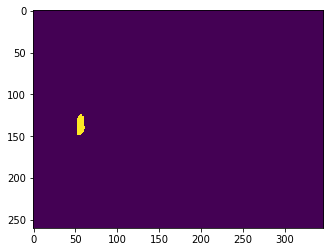

37 /root/kaggle/stage1_test/78a981bd27ba0c65a9169548665a17bda9f49050d0d3893a6567d1eb92cd003d/images/78a981bd27ba0c65a9169548665a17bda9f49050d0d3893a6567d1eb92cd003d.png
Processing 1 images
image                    shape: (520, 348, 3)         min: -120.70000  max:   82.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -244.40000  max:  -21.80000
image_metas              shape: (1, 10)               min:    0.00000  max:  964.00000


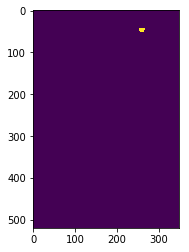

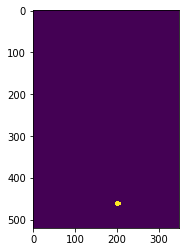

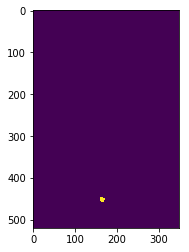

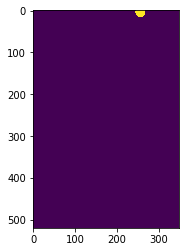

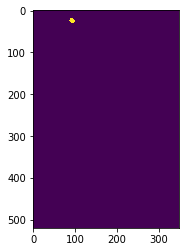

...

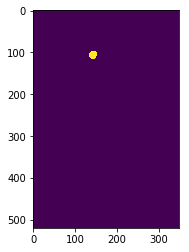

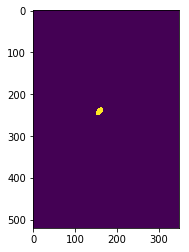

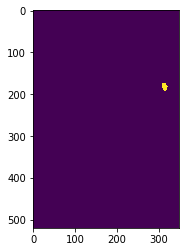

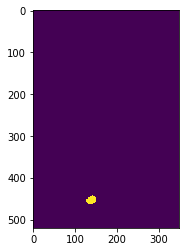

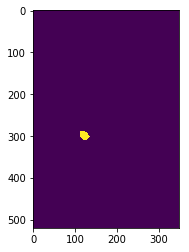

38 /root/kaggle/stage1_test/7bdb668e6127b7eafc837a883f0648002bd063c736f55a4f673e787250a3fb04/images/7bdb668e6127b7eafc837a883f0648002bd063c736f55a4f673e787250a3fb04.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -123.70000  max:   73.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:  -30.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


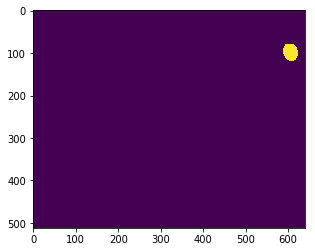

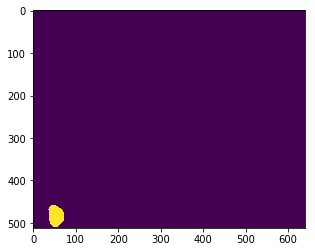

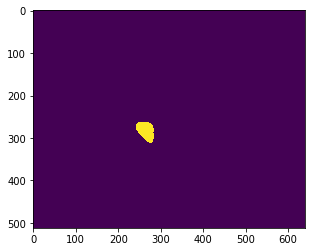

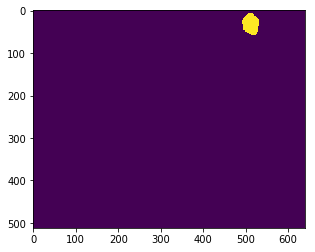

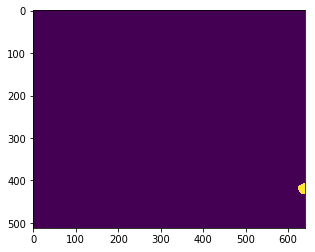

...

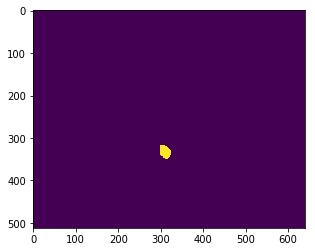

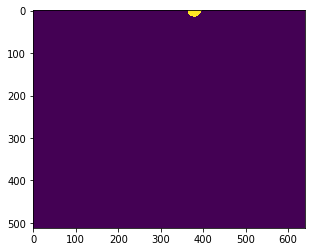

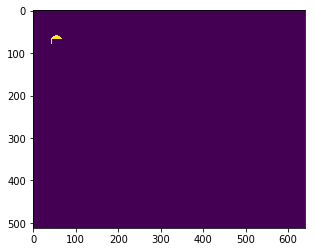

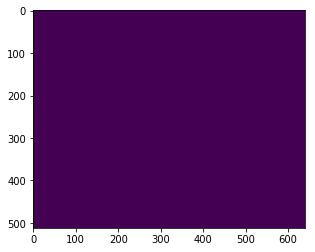

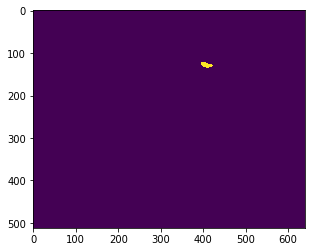

39 /root/kaggle/stage1_test/7f4cbe0b36b5d09466476a7d4e01f4f976c67872d549f4ff47b3e1e3a2b403af/images/7f4cbe0b36b5d09466476a7d4e01f4f976c67872d549f4ff47b3e1e3a2b403af.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -123.70000  max:  141.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   37.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


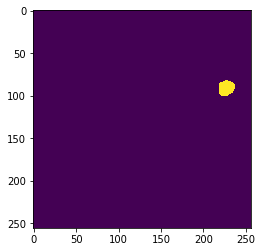

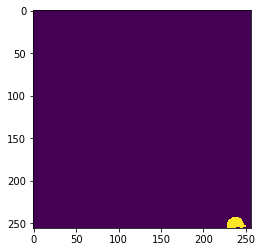

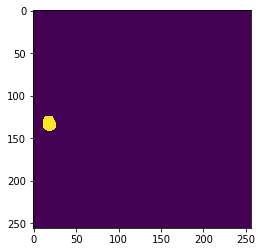

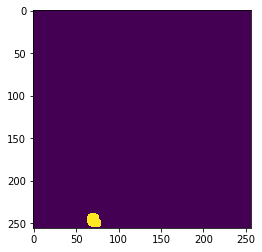

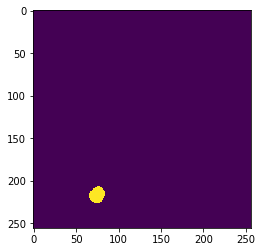

...

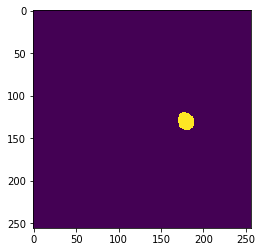

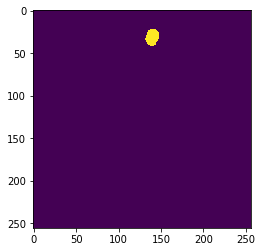

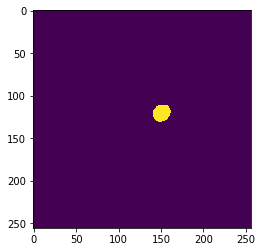

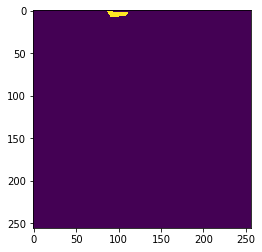

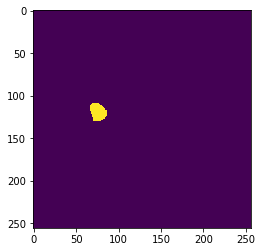

40 /root/kaggle/stage1_test/8922a6ac8fd0258ec27738ca101867169b20d90a60fc84f93df77acd5bf7c80b/images/8922a6ac8fd0258ec27738ca101867169b20d90a60fc84f93df77acd5bf7c80b.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -123.70000  max:   82.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:  -21.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


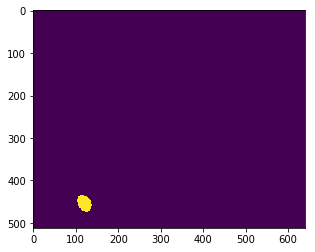

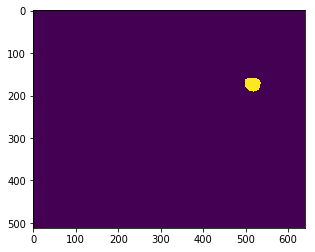

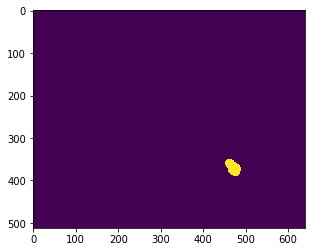

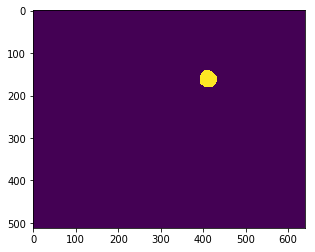

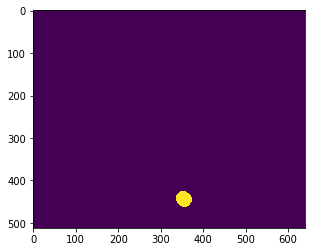

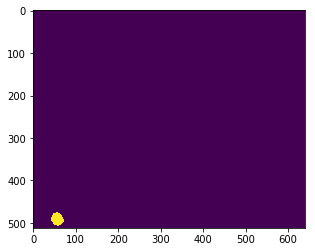

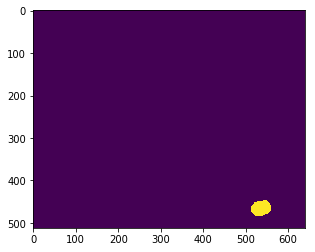

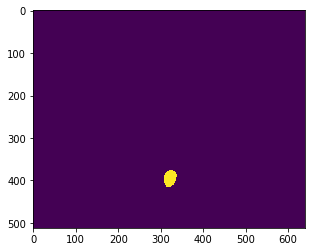

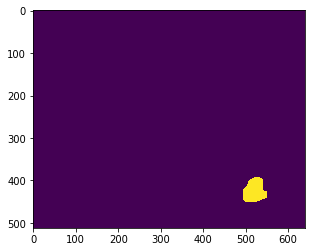

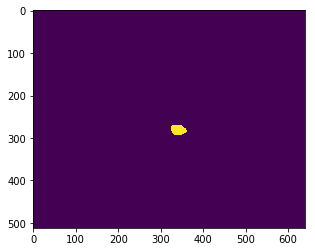

41 /root/kaggle/stage1_test/8b59819fbc92eefe45b1db95c0cc3a467ddcfc755684c7f2ba2f6ccb9ad740ab/images/8b59819fbc92eefe45b1db95c0cc3a467ddcfc755684c7f2ba2f6ccb9ad740ab.png
Processing 1 images
image                    shape: (520, 696, 3)         min: -113.70000  max:  133.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   29.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1052.00000


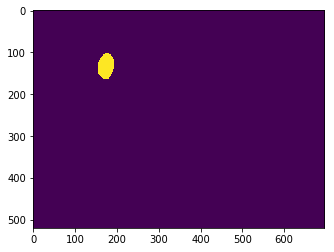

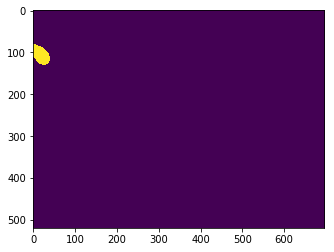

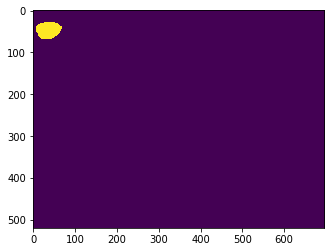

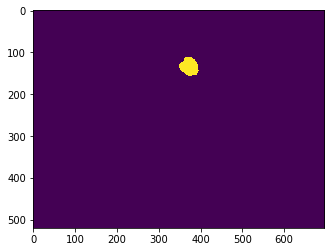

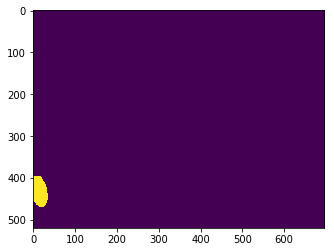

...

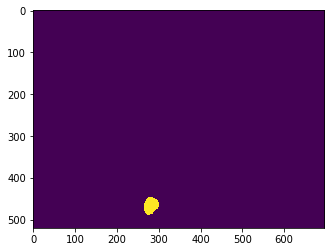

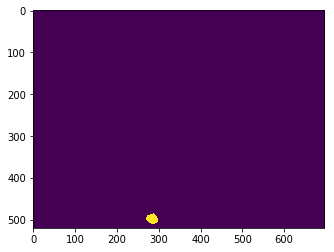

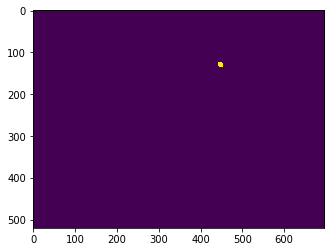

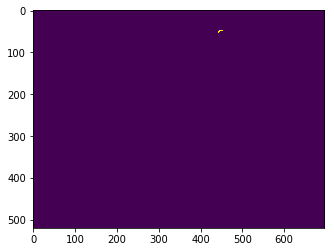

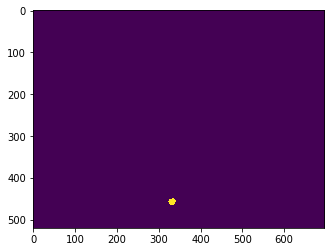

42 /root/kaggle/stage1_test/912a679e4b9b1d1a75170254fd675b8c24b664d80ad7ea7e460241a23535a406/images/912a679e4b9b1d1a75170254fd675b8c24b664d80ad7ea7e460241a23535a406.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -113.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


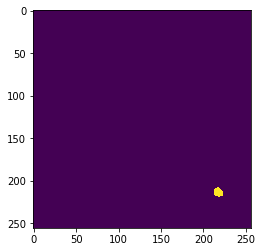

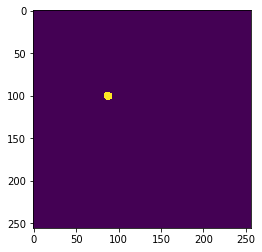

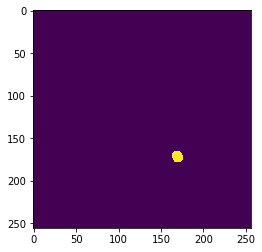

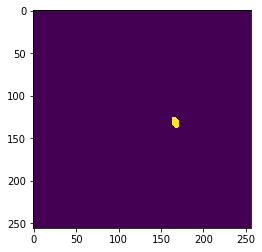

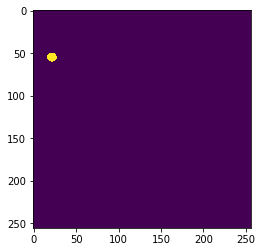

...

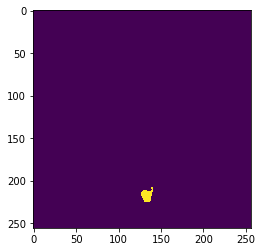

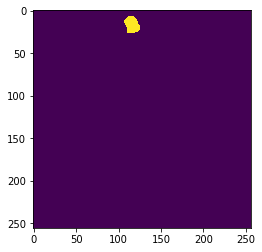

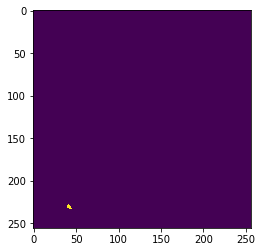

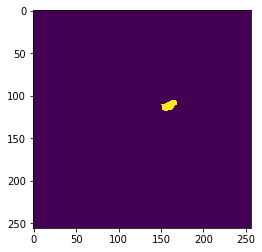

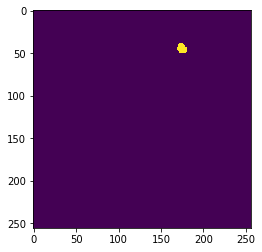

43 /root/kaggle/stage1_test/9ab2d381f90b485a68b82bc07f94397a0373e3215ad20935a958738e55f3cfc2/images/9ab2d381f90b485a68b82bc07f94397a0373e3215ad20935a958738e55f3cfc2.png
Processing 1 images
image                    shape: (512, 640, 3)         min: -123.70000  max:    5.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:  -98.80000
image_metas              shape: (1, 10)               min:    0.00000  max: 1024.00000


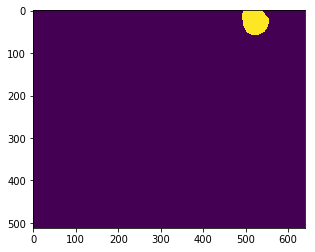

44 /root/kaggle/stage1_test/9f17aea854db13015d19b34cb2022cfdeda44133323fcd6bb3545f7b9404d8ab/images/9f17aea854db13015d19b34cb2022cfdeda44133323fcd6bb3545f7b9404d8ab.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


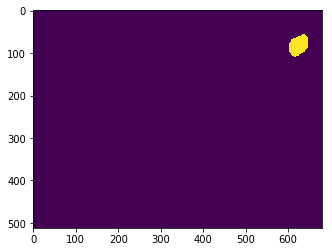

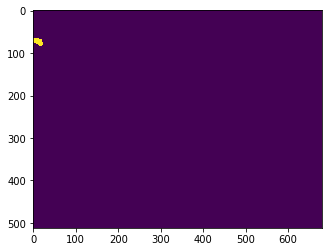

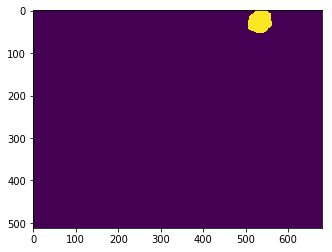

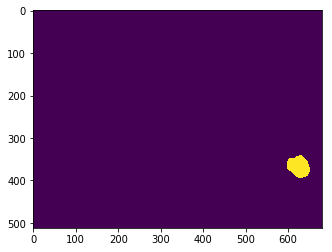

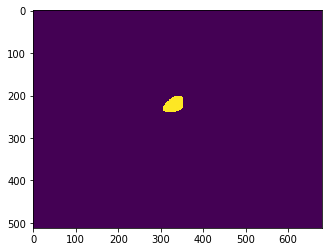

...

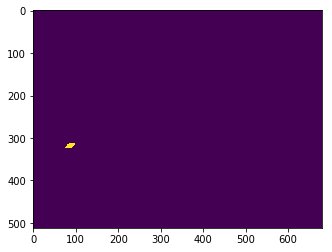

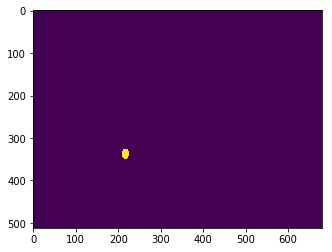

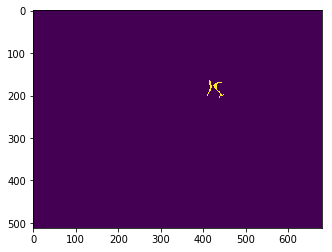

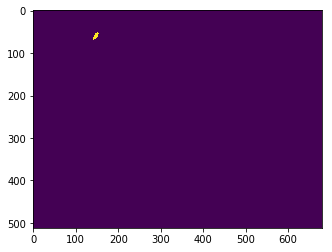

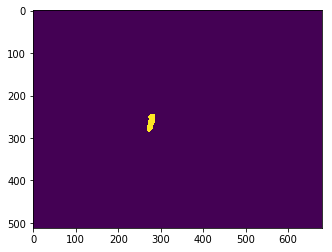

45 /root/kaggle/stage1_test/a4816cc1fb76cb3c5e481186833fc0ae9cf426a1406a2607e974e65e9cddba4f/images/a4816cc1fb76cb3c5e481186833fc0ae9cf426a1406a2607e974e65e9cddba4f.png
Processing 1 images
image                    shape: (519, 253, 3)         min: -114.70000  max:   -2.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -238.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


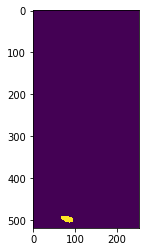

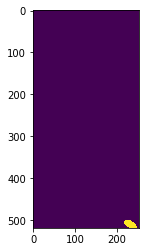

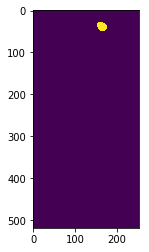

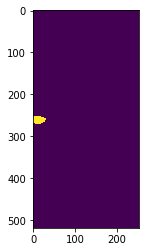

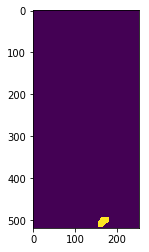

...

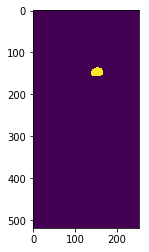

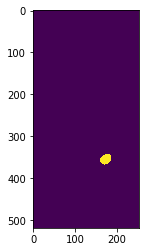

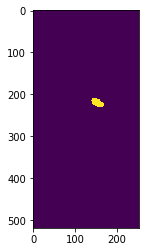

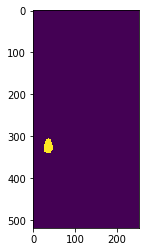

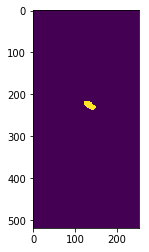

46 /root/kaggle/stage1_test/a984e7fb886aa02e29d112766d3ce26a4f78eac540ce7bbdbd42af2761928f6d/images/a984e7fb886aa02e29d112766d3ce26a4f78eac540ce7bbdbd42af2761928f6d.png
Processing 1 images
image                    shape: (519, 161, 3)         min: -118.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -242.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


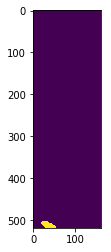

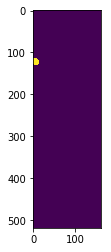

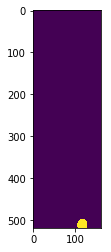

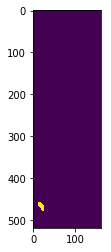

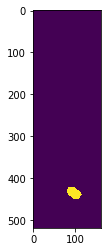

...

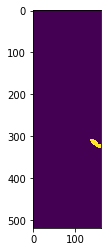

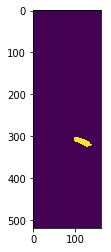

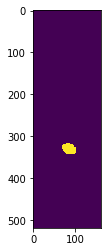

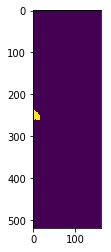

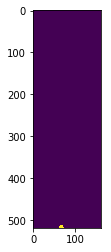

47 /root/kaggle/stage1_test/ab298b962a63e4be9582513aaa84a5e270adba5fd2b16a50e59540524f63c3b8/images/ab298b962a63e4be9582513aaa84a5e270adba5fd2b16a50e59540524f63c3b8.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -123.70000  max:  -14.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


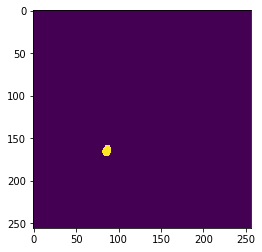

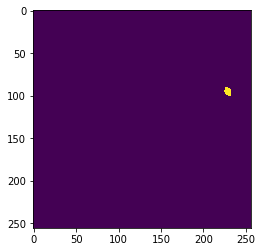

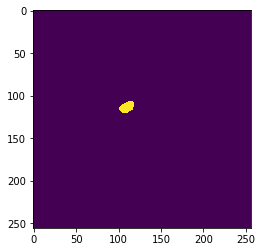

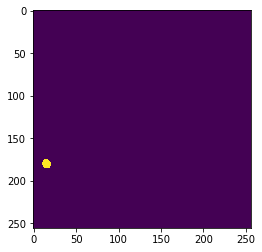

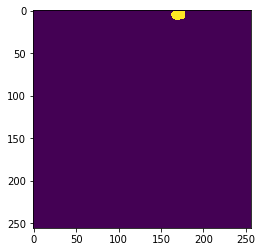

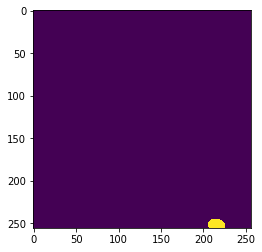

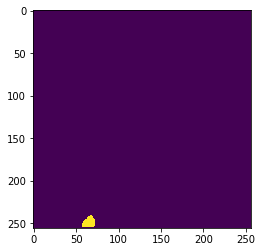

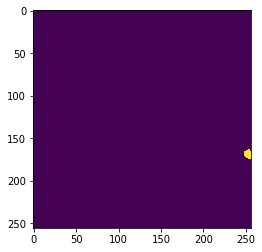

48 /root/kaggle/stage1_test/ade080c6618cbbb0a25680cf847f312b5e19b22bfe1cafec0436987ebe5b1e7e/images/ade080c6618cbbb0a25680cf847f312b5e19b22bfe1cafec0436987ebe5b1e7e.png
Processing 1 images
image                    shape: (520, 696, 3)         min: -112.70000  max:  121.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -236.40000  max:   17.20000
image_metas              shape: (1, 10)               min:    0.00000  max: 1052.00000


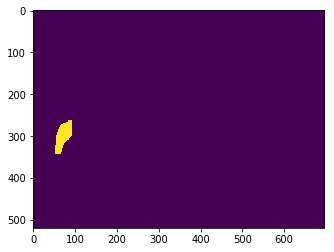

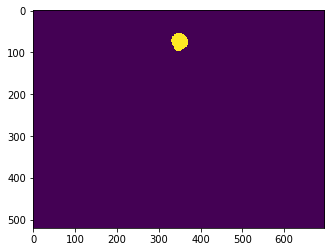

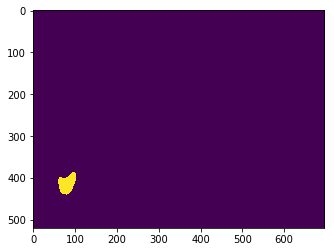

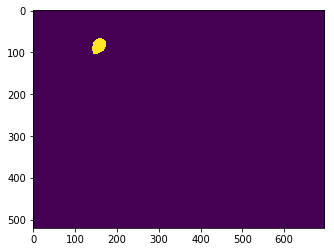

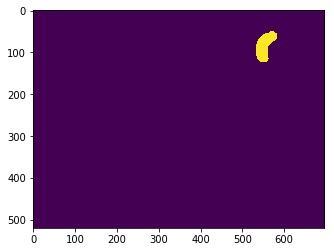

...

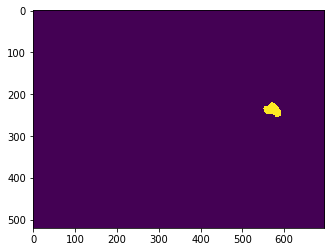

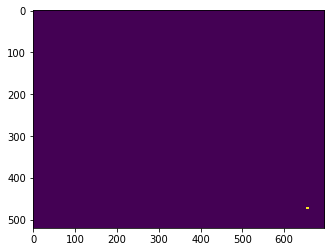

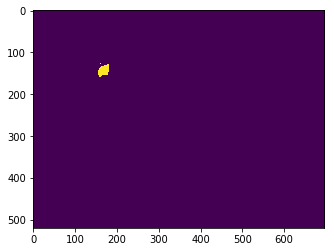

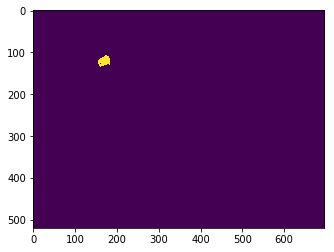

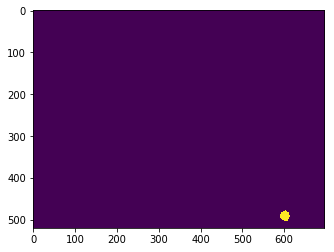

49 /root/kaggle/stage1_test/b83d1d77935b6cfd44105b54600ffc4b6bd82de57dec65571bcb117fa8398ba3/images/b83d1d77935b6cfd44105b54600ffc4b6bd82de57dec65571bcb117fa8398ba3.png
Processing 1 images
image                    shape: (524, 348, 3)         min: -123.70000  max:  145.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   41.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  966.00000


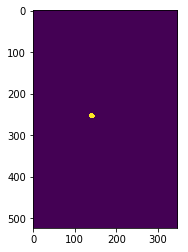

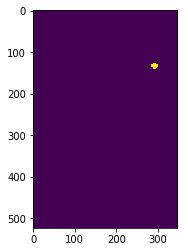

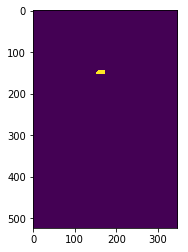

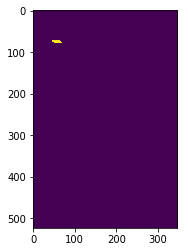

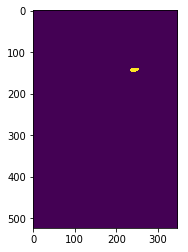

...

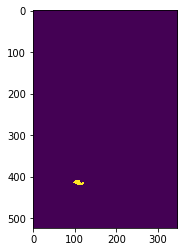

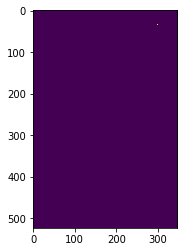

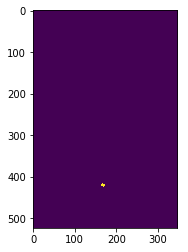

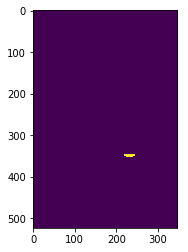

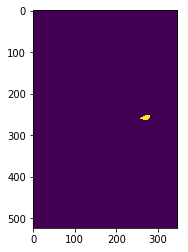

50 /root/kaggle/stage1_test/bdc789019cee8ddfae20d5f769299993b4b330b2d38d1218646cf89e77fbbd4d/images/bdc789019cee8ddfae20d5f769299993b4b330b2d38d1218646cf89e77fbbd4d.png
Processing 1 images
image                    shape: (520, 696, 3)         min: -112.70000  max:  126.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -236.40000  max:   22.20000
image_metas              shape: (1, 10)               min:    0.00000  max: 1052.00000


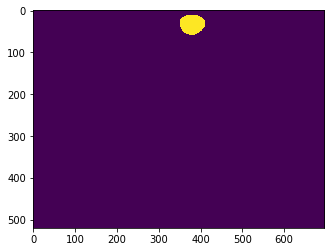

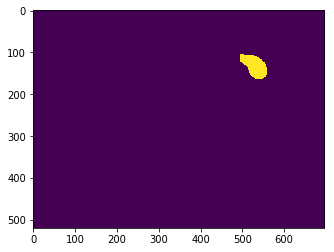

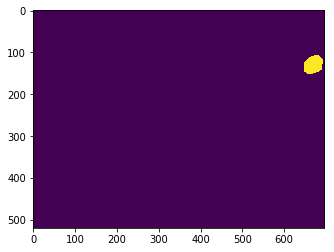

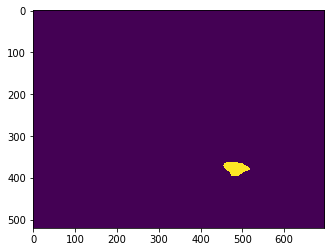

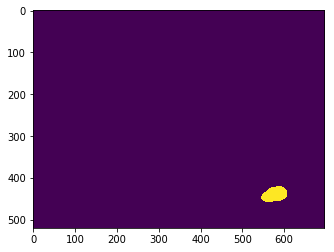

...

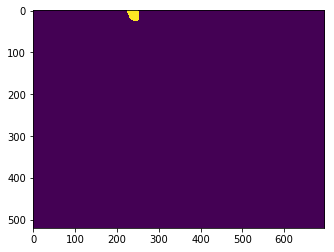

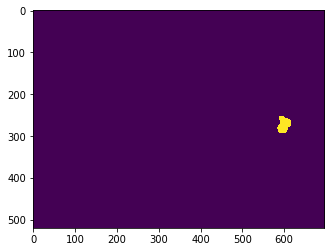

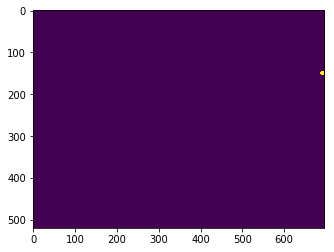

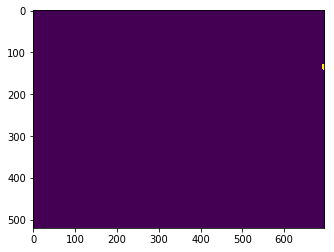

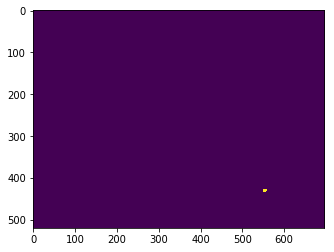

51 /root/kaggle/stage1_test/c8e79ff4ac55f4b772057de28e539727b7f4f2a3de73bf7a082a0ace86d609eb/images/c8e79ff4ac55f4b772057de28e539727b7f4f2a3de73bf7a082a0ace86d609eb.png
Processing 1 images
image                    shape: (524, 348, 3)         min: -123.70000  max:  149.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   45.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  966.00000


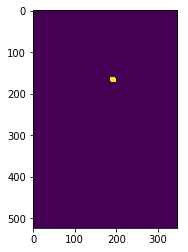

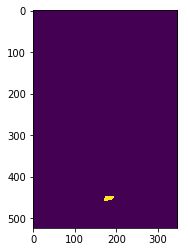

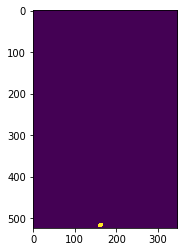

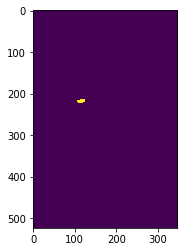

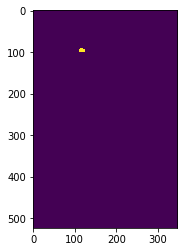

...

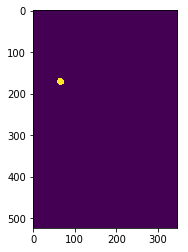

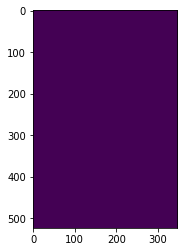

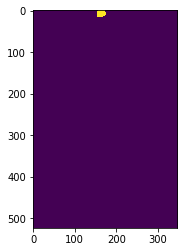

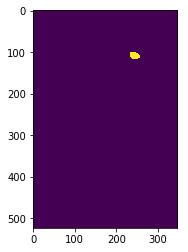

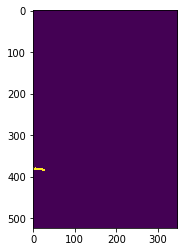

52 /root/kaggle/stage1_test/ca20076870e8fb604e61802605a9ac45419c82dd3e23404c56c4869f9502a5ef/images/ca20076870e8fb604e61802605a9ac45419c82dd3e23404c56c4869f9502a5ef.png
Processing 1 images
image                    shape: (519, 161, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


53 /root/kaggle/stage1_test/d616d323a9eeb9da1b66f8d5df671d63c092c9919cb2c0b223e29c63257c944d/images/d616d323a9eeb9da1b66f8d5df671d63c092c9919cb2c0b223e29c63257c944d.png
Processing 1 images
image                    shape: (519, 162, 3)         min: -120.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -244.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


54 /root/kaggle/stage1_test/d6eb7ce7723e2f6dc13b90b41a29ded27dbd815bad633fdf582447c686018896/images/d6eb7ce7723e2f6dc13b90b41a29ded27dbd815bad633fdf582447c686018896.png
Processing 1 images
image                    shape: (520, 348, 3)         min: -123.70000  max:   97.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   -6.80000
image_metas              shape: (1, 10)               min:    0.00000  max:  964.00000


55 /root/kaggle/stage1_test/d8d4bf68a76e4e4c5f21de7ac613451f7115a04db686151e78b8ec0b6a22022b/images/d8d4bf68a76e4e4c5f21de7ac613451f7115a04db686151e78b8ec0b6a22022b.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -115.70000  max:   88.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -239.40000  max:  -15.80000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


56 /root/kaggle/stage1_test/da6c593410340b19bb212b9f6d274f95b08c0fc8f2570cd66bc5ed42c560acab/images/da6c593410340b19bb212b9f6d274f95b08c0fc8f2570cd66bc5ed42c560acab.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


57 /root/kaggle/stage1_test/dab46d798d29aff2e99c23f47ed3064f5cafb1644629b015c95a2dd2ee593bb4/images/dab46d798d29aff2e99c23f47ed3064f5cafb1644629b015c95a2dd2ee593bb4.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -122.70000  max:   -8.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -246.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


58 /root/kaggle/stage1_test/df40099c6306ca1f47fcc8a62e2fa39486d4e223177afdc51b2ad189691802d8/images/df40099c6306ca1f47fcc8a62e2fa39486d4e223177afdc51b2ad189691802d8.png
Processing 1 images
image                    shape: (260, 347, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  877.00000


59 /root/kaggle/stage1_test/e17b7aedd251a016c01ef9158e6e4aa940d9f1b35942d86028dc1222192a9258/images/e17b7aedd251a016c01ef9158e6e4aa940d9f1b35942d86028dc1222192a9258.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -122.70000  max:  -21.90000
molded_images            shape: (1, 1408, 1408, 3)    min: -246.40000  max: -103.90000
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


60 /root/kaggle/stage1_test/eea70a7948d25a9a791dbcb39228af4ea4049fe5ebdee9c04884be8cca3da835/images/eea70a7948d25a9a791dbcb39228af4ea4049fe5ebdee9c04884be8cca3da835.png
Processing 1 images
image                    shape: (519, 253, 3)         min: -113.70000  max:  121.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -237.40000  max:   17.20000
image_metas              shape: (1, 10)               min:    0.00000  max:  963.00000


61 /root/kaggle/stage1_test/f0d0ab13ff53adc3c4d57e95a5f83d80b06f2cbc0bf002b52cf7b496612e0ce4/images/f0d0ab13ff53adc3c4d57e95a5f83d80b06f2cbc0bf002b52cf7b496612e0ce4.png
Processing 1 images
image                    shape: (520, 696, 3)         min: -112.70000  max:  118.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -236.40000  max:   14.20000
image_metas              shape: (1, 10)               min:    0.00000  max: 1052.00000


62 /root/kaggle/stage1_test/f5effed21f671bbf4551ecebb7fe95f3be1cf09c16a60afe64d2f0b95be9d1eb/images/f5effed21f671bbf4551ecebb7fe95f3be1cf09c16a60afe64d2f0b95be9d1eb.png
Processing 1 images
image                    shape: (512, 680, 3)         min: -123.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -247.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max: 1044.00000


63 /root/kaggle/stage1_test/fac507fa4d1649e8b24c195d990f1fc3ca3633d917839e1751a9d412a14ab5e3/images/fac507fa4d1649e8b24c195d990f1fc3ca3633d917839e1751a9d412a14ab5e3.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -114.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -238.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


64 /root/kaggle/stage1_test/fe9adb627a6f45747c5a8223b671774791ededf9364f6544be487c540107fa4f/images/fe9adb627a6f45747c5a8223b671774791ededf9364f6544be487c540107fa4f.png
Processing 1 images
image                    shape: (256, 256, 3)         min: -114.70000  max:  151.10000
molded_images            shape: (1, 1408, 1408, 3)    min: -238.40000  max:   47.20001
image_metas              shape: (1, 10)               min:    0.00000  max:  832.00000


In [30]:
test_rle = []
test_imageids = []
test_scores = []
for i,path in enumerate(img_paths):
    print(i,path)
    img = np.array(Image.open(path).convert('RGB'))
    molded_images = np.expand_dims(modellib.mold_image(img, inference_config), 0)
    results = model.detect(molded_images, verbose=1)
    r = results[0]

#     visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
#                             dataset_val.class_names, r['scores'])
#     plt.show()
    
    full_masks = r['masks']
    N = full_masks.shape[-1]
    
    used = np.zeros_like(full_masks[:,:,0])
    remain = np.logical_not(used)
    for j in range(N):
        mask = full_masks[:,:,j]
        mask = mask * remain
        rle,_ = mask_encoding(mask)
        
        plt.imshow(mask)
        plt.show()
#         indics = mask > 0
#         mask[indics] = 255
#         mask_im = Image.fromarray(mask)
#         mask_im.save(DATA_DIR + 'stage1_test/' + imageids[i] +'/mask' + str(j) +'.png','PNG')
        used = np.logical_or(mask > 0,used)
        remain = np.logical_not(used)
        
        if len(rle) == 0: 
            continue
        rle_str = ' '.join([str(r) for r in rle])
        test_rle.append(rle_str)
        test_imageids.append(imageids[i])
#         break
#     break
        

In [25]:
df = pd.DataFrame({ 'ImageId' : test_imageids , 'EncodedPixels' : test_rle})
df.to_csv('submition7.csv', index=False, columns=['ImageId', 'EncodedPixels'])

In [26]:
df = pd.read_csv('submition7.csv')

In [27]:
len(df)

2578

In [38]:
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

# Get path to saved weights
# Either set a specific path or find last trained weights
model_path = os.path.join(ROOT_DIR, "logs/nuclei20180129T1845/mask_rcnn_nuclei_0004.h5")
# model_path = model.find_last()[1]

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /root/Cloud_Mask_RCNN/logs/nuclei20180129T1845/mask_rcnn_nuclei_0004.h5


In [42]:
df = pd.read_csv('submition5.csv')

In [50]:
miss = df.loc[df['ImageId'] == '1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b']
miss

,ImageId,EncodedPixels
211,1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c...,156010 36 156522 36 157034 37 157546 38 158058...


In [55]:
newdf = pd.read_csv('submition7.csv')
newdf = newdf.append(miss, ignore_index=True)

In [56]:
newdf.loc[newdf['ImageId'] == '1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b']

,ImageId,EncodedPixels
2578,1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c...,156010 36 156522 36 157034 37 157546 38 158058...


In [57]:
newdf.to_csv('submition8.csv', index=False, columns=['ImageId', 'EncodedPixels'])